# Continuous $paO_2$ Prediction and Postoperative Complications in

Neurosurgical Patients

Analysis of postoperative complications - normalized $paO_2$ values

Andrea S. Gutmann  
2026-01-16

# 1. Loading required libraries and data

In [1]:
# ======================
# Standard library
# ======================
import csv
import math
import os
import pickle
import platform
import pprint
import random
import sys
import time
from collections import Counter
from datetime import datetime
from pathlib import Path
from time import perf_counter

# ======================
# Third-party libraries
# ======================
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import yaml
from scipy import stats
from sklearn.linear_model import SGDRegressor

# ======================
# Local / application
# ======================
import session_info
from statistical_functions import *

pp = pprint.PrettyPrinter(indent=4)
np.random.seed(42)

matplotlib.rcParams["figure.dpi"] = 300

sns.set_style('whitegrid')

with open("config.yaml", "r") as file:
    config = yaml.safe_load(file)

with open(Path(config.get('pickle').get('analysis')), 'rb') as f:
    data = pickle.load(f)

data = data.astype({'max_paO2': float, 'norm_auc_paO2': float, 'norm_auc_pf': float})

complications = config.get("complications_dict").keys()
diagnoses = config.get("diagnoses") + ["other"]

# 2. Prepare data

In [2]:
print(f"Measured: {len(data.loc[data['pao2_type_measured']==True,:]):,}, predicted: {len(data.loc[data['pao2_type_measured']==False,:]):,}, number of surgeries: {len(data.identifier.unique()):,}, number of patients: {len(data.case_number.unique()):,}.")

analysis_df = data.loc[:, ['identifier', 'case_number', 'opdatum',
       'bmi', 'age', 'los', 'already_intubated', 'not_extubated',
       'ops', 'asa', 'time_to_incision',
       'time_to_end', 'mv_time', 'theater', 'sex_male',
       'incision_closure_time', 'creatinine', 'deceased',
       'intervention_count', 'sap_procedures',
       'norm_auc_paO2', 'norm_auc_pf', 'max_paO2'] + list(config.get('procedure_codes')) + list(config.get("complications_dict_short").keys()) + diagnoses].drop_duplicates()


analysis_df = analysis_df.astype({'asa': 'int', 'sex_male': 'int', 'already_intubated': 'int', 'not_extubated': 'int'}).astype({'asa': 'object', 'sex_male': 'object', 'already_intubated': 'object', 'not_extubated': 'object'})

print(f"Total number of patients for analysis: {len(analysis_df):,}.")

Measured: 19,665, predicted: 304,928, number of surgeries: 5,020, number of patients: 5,020.
Total number of patients for analysis: 5,020.


1378367 Counter({0: 161, 1: 6})
1930358 Counter({0: 157, 1: 10})
485488 Counter({0: 173, 1: 17})
776344 Counter({0: 185, 1: 20})
760577 Counter({0: 246, 1: 21})
1019888


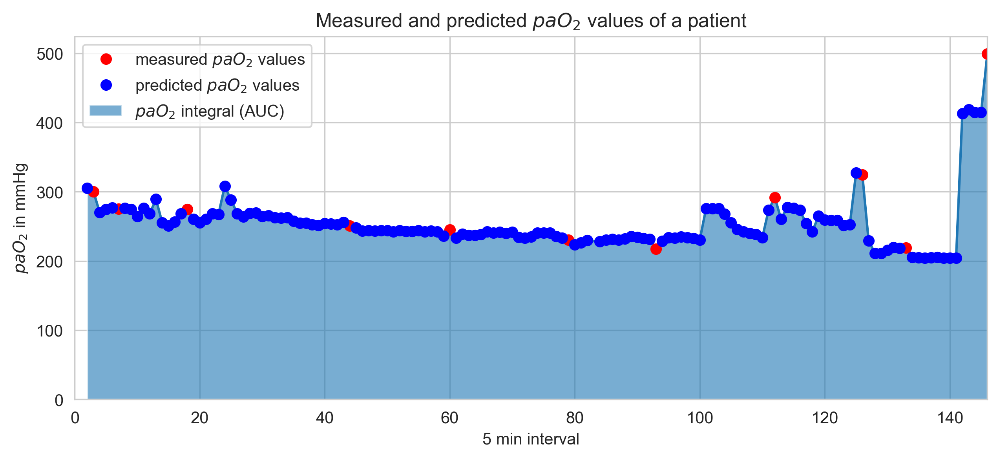

In [3]:
selected_identifiers = list(map(lambda x: x[0], list(sorted(Counter(data["identifier"]).items(),key = lambda x:x[1]))[-5:]))

for identifier in selected_identifiers:
    print(identifier, Counter(data.loc[data["identifier"]==identifier,"pao2_type_measured"]))

zipped = zip(selected_identifiers, [Counter(data.loc[data["identifier"]==identifier,"pao2_type_measured"]) for identifier in selected_identifiers])

max_entry = sorted(zipped, key=lambda x: -x[1][1])[0]

identifier_used = 1019888 # max_entry[0]
print(identifier_used)

matplotlib.rcParams["figure.dpi"] = 300
fig, ax = plt.subplots(figsize=(10,4))
y_measured = data.loc[(data["identifier"]==identifier_used)&(data["pao2_type_measured"]==1),"paO2_combined"]
x_measured = data.loc[(data["identifier"]==identifier_used)&(data["pao2_type_measured"]==1),"idx"]
y_predicted = data.loc[(data["identifier"]==identifier_used)&(data["pao2_type_measured"]==0),"paO2_combined"]
x_predicted = data.loc[(data["identifier"]==identifier_used)&(data["pao2_type_measured"]==0),"idx"]

df_id = data.loc[data["identifier"] == identifier_used].sort_values("idx")
ax.plot(df_id["idx"], df_id["paO2_combined"], "-")
ax.plot(x_measured, y_measured,"o", color = "red", label="measured $paO_2$ values")
ax.plot(x_predicted, y_predicted,"o", color = "blue", label="predicted $paO_2$ values")

ax.fill_between(df_id["idx"], df_id["paO2_combined"], 0, alpha=0.6, label="$paO_2$ integral (AUC)")

ax.set_xlabel("5 min interval")
ax.set_ylabel("$paO_2$ in mmHg")

ax.set_xlim(0, max(data.loc[(data["identifier"]==identifier_used),"idx"]))
ax.set_ylim(0)
ax.legend()

plt.savefig(f"plots/pao2_auc_example.png", dpi=300, bbox_inches="tight")
ax.set_title("Measured and predicted $paO_2$ values of a patient")

plt.show()

plt.close("all")

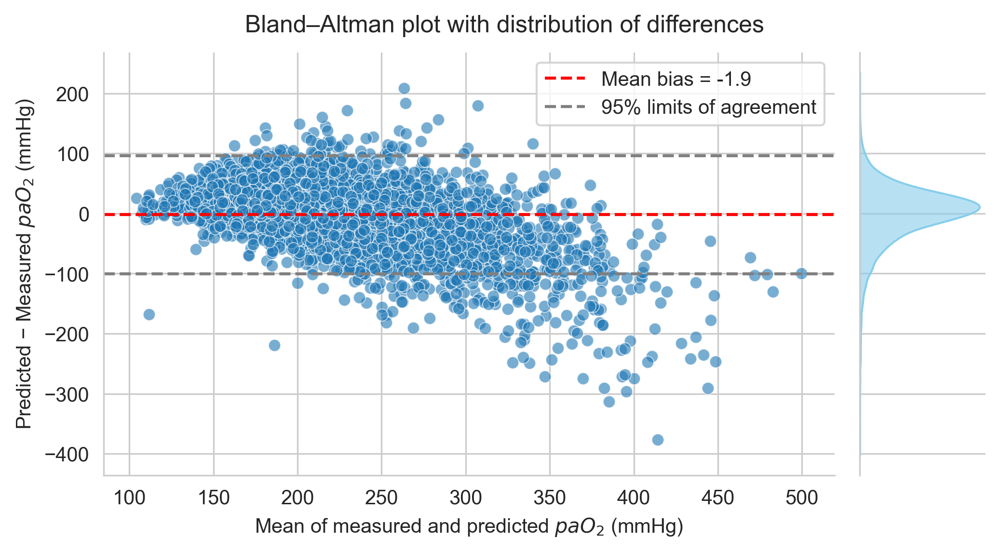

In [4]:
avg_data = (
    data.groupby(['identifier', 'pao2_type_measured'])['paO2_combined']
    .mean()
    .reset_index()
    .pivot(index='identifier', columns='pao2_type_measured', values='paO2_combined')
    .dropna()  # drop patients without both values
)

# Rename columns for clarity
avg_data = avg_data.rename(columns={1: 'Measured', 0: 'Predicted'})
avg_data['Mean'] = avg_data[['Measured', 'Predicted']].mean(axis=1)
avg_data['Difference'] = avg_data['Predicted'] - avg_data['Measured']

mean_diff = avg_data['Difference'].mean()
sd_diff = avg_data['Difference'].std()

# Create joint grid: scatter in middle, KDE on the side
g = sns.JointGrid(
    data=avg_data,
    x="Mean",
    y="Difference",
    height=6
)
g.fig.set_size_inches(7, 4)

# Scatter for Bland–Altman
g.plot_joint(sns.scatterplot, alpha=0.6)

# Add horizontal lines for bias and LoA
g.ax_joint.axhline(mean_diff, color='red', linestyle='--', label=f'Mean bias = {mean_diff:.1f}')
g.ax_joint.axhline(mean_diff + 1.96*sd_diff, color='gray', linestyle='--', label='95% limits of agreement')
g.ax_joint.axhline(mean_diff - 1.96*sd_diff, color='gray', linestyle='--')
g.ax_joint.legend()

# Hide the empty top marginal axis
g.ax_marg_x.remove()

# KDE for marginal distribution of differences
sns.kdeplot(
    y=avg_data["Difference"],
    fill=True, color="skyblue", ax=g.ax_marg_y, alpha=0.6
)

# Labels and title
g.set_axis_labels("Mean of measured and predicted $paO_2$ (mmHg)",
                  "Predicted − Measured $paO_2$ (mmHg)")

plt.savefig(f"plots/bland-altman-density.png", dpi=300, bbox_inches="tight")
g.fig.suptitle("Bland–Altman plot with distribution of differences", y=0.89)

plt.show()

# 3. Analysis

## 3.1 Patient characteristics

Combined $paO_2$ values

In [5]:
# all 
desc_df = data.loc[:,config.get('one_measurements')+config.get('multi_measurements')]

single_meas = (
    desc_df[config.get("one_measurements")]
    .groupby(["identifier"])
    .aggregate("mean")
    .describe(include="all")
    .reindex(sorted(config.get("one_measurements")), axis=1)
)

multiple_meas = (
    desc_df[config.get("multi_measurements")]
    .describe(include="all")
    .reindex(sorted(config.get("multi_measurements")), axis=1)
)

descriptive_df = multiple_meas.join(single_meas).drop("identifier", axis=1)

display(
    descriptive_df.rename(columns=config.get('feature_names')).T.rename_axis("my_idx")
    .sort_values(["count", "my_idx"])
    .round(2)
    .astype({"count": "int"})
    # .format(float_format=",.2f", index_label="")
)
descriptive_df.rename(columns=config.get('feature_names')).T.rename_axis("my_idx").sort_values(["count", "my_idx"]).round(2).astype({"count": "int"}).to_csv("./data/out/sdc5_table.csv", float_format="%.2f", decimal=".", index_label="")


,count,mean,std,min,25%,50%,75%,max
my_idx,,,,,,,,
$_{norm}p/F ratio$,5020,455.55,85.81,76.54,399.46,455.39,507.55,1465.54
$_{norm}paO_2$,5020,220.24,46.32,39.78,188.21,214.06,245.95,455.95
$paO_2$ AUC in $mmHg^2$,5020,69543.14,26860.62,7119.95,51015.52,67640.50,85394.13,360536.78
Age in years,5020,53.90,15.94,18.00,43.00,55.00,66.00,94.00
BMI in $kg/m^2$,5020,25.17,4.39,14.81,22.31,24.62,27.47,59.20
Mechanically ventilated before surgery,5020,0.07,0.25,0.00,0.00,0.00,0.00,1.00
Preoperative creatinine value,5020,0.94,0.29,0.20,0.80,0.90,1.00,9.30
incision to closure time in min,5020,239.34,103.57,13.00,172.00,231.00,296.56,1194.25
initially measured p/F ratio in mmHg,5020,477.14,125.91,300.00,398.79,467.42,530.04,2598.15


Measured $paO_2$

In [6]:
## measured paO2 
desc_df = data.loc[data['pao2_type_measured']==True,config.get('one_measurements')+config.get('multi_measurements')]

single_meas = (
    desc_df[config.get("one_measurements")]
    .groupby(["identifier"])
    .aggregate("mean")
    .describe(include="all")
    .reindex(sorted(config.get("one_measurements")), axis=1)
)

multiple_meas = (
    desc_df[config.get("multi_measurements")]
    .describe(include="all")
    .reindex(sorted(config.get("multi_measurements")), axis=1)
)

descriptive_df = multiple_meas.join(single_meas).drop("identifier", axis=1)

display(
    descriptive_df.T.rename_axis("my_idx")
    .sort_values(["count", "my_idx"])
    .round(2)
    .astype({"count": "int"})
)

,count,mean,std,min,25%,50%,75%,max
my_idx,,,,,,,,
first_horowitz,5019,477.15,125.92,300.00,398.76,467.42,530.04,2598.15
age,5020,53.90,15.94,18.00,43.00,55.00,66.00,94.00
already_intubated,5020,0.07,0.25,0.00,0.00,0.00,0.00,1.00
auc_paO2,5020,69543.14,26860.62,7119.95,51015.52,67640.50,85394.13,360536.78
bmi,5020,25.17,4.39,14.81,22.31,24.62,27.47,59.20
creatinine,5020,0.94,0.29,0.20,0.80,0.90,1.00,9.30
incision_closure_time,5020,239.34,103.57,13.00,172.00,231.00,296.56,1194.25
intervention_count,5020,1.05,0.29,1.00,1.00,1.00,1.00,7.00
los,5020,10.95,9.93,1.00,6.00,7.00,12.00,175.00


Imputed $paO_2$

In [7]:
## imputed paO2
desc_df = data.loc[data['pao2_type_measured']==False,config.get('one_measurements')+config.get('multi_measurements')]

single_meas = (
    desc_df[config.get("one_measurements")]
    .groupby(["identifier"])
    .aggregate("mean")
    .describe(include="all")
    .reindex(sorted(config.get("one_measurements")), axis=1)
)

multiple_meas = (
    desc_df[config.get("multi_measurements")]
    .describe(include="all")
    .reindex(sorted(config.get("multi_measurements")), axis=1)
)

descriptive_df = multiple_meas.join(single_meas).drop("identifier", axis=1)

display(
    descriptive_df.T.rename_axis("my_idx")
    .sort_values(["count", "my_idx"])
    .round(2)
    .astype({"count": "int"})
)
# descriptive_df.T.rename_axis("my_idx").sort_values(["count", "my_idx"]).round(2).astype({"count": "int"}).to_csv(config.get('csv').get('descriptives'))

,count,mean,std,min,25%,50%,75%,max
my_idx,,,,,,,,
first_horowitz,5016,477.21,125.92,300.00,398.94,467.46,530.06,2598.15
age,5020,53.90,15.94,18.00,43.00,55.00,66.00,94.00
already_intubated,5020,0.07,0.25,0.00,0.00,0.00,0.00,1.00
auc_paO2,5020,69543.14,26860.62,7119.95,51015.52,67640.50,85394.13,360536.78
bmi,5020,25.17,4.39,14.81,22.31,24.62,27.47,59.20
creatinine,5020,0.94,0.29,0.20,0.80,0.90,1.00,9.30
incision_closure_time,5020,239.34,103.57,13.00,172.00,231.00,296.56,1194.25
intervention_count,5020,1.05,0.29,1.00,1.00,1.00,1.00,7.00
los,5020,10.95,9.93,1.00,6.00,7.00,12.00,175.00


### 3.1.1 $paO_2$ Values (mean per patient)

In [8]:
measured1 = data.loc[(data["pao2_type_measured"]==1),:].groupby("identifier").agg({"paO2_combined":"mean"})
measured1["paO2_type"] = "measured"
measured1["timepoint"] = "peri-operative"
predicted1 = data.loc[(data["pao2_type_measured"]==0),:].groupby("identifier").agg({"paO2_combined":"mean"})
predicted1["paO2_type"] = "predicted"
predicted1["timepoint"] = "peri-operative"


plot_data = pd.concat([measured1, predicted1], axis=0)

# measured paO2 
print(f"Descriptives of measured perioperative paO2 values (mean per patient):\n{data.loc[(data['pao2_type_measured']==1),:].groupby('identifier').agg({'paO2_combined':'mean'}).describe().round(2)}")

# predicted paO2
print(f"Descriptives of predicted perioperative paO2 values (mean per patient):\n{data.loc[(data['pao2_type_measured']==0),:].groupby('identifier').agg({'paO2_combined':'mean'}).describe().round(2)}")

# all paO2 TODO contiue here
print(f"Descriptives of all perioperative paO2 values (mean per patient):\n{data.groupby('identifier').agg({'paO2_combined':'mean'}).describe().round(2)}")


pval, ph_dunn, effect_sizes = compare_median("paO2_combined", plot_data, "paO2_type")

Descriptives of measured perioperative paO2 values (mean per patient):
       paO2_combined
count        5020.00
mean          223.29
std            71.22
min            91.50
25%           173.75
50%           209.33
75%           256.89
max           602.70
Descriptives of predicted perioperative paO2 values (mean per patient):
       paO2_combined
count        5020.00
mean          221.40
std            45.62
min            27.78
25%           189.86
50%           215.70
75%           246.87
max           449.67
Descriptives of all perioperative paO2 values (mean per patient):
       paO2_combined
count        5020.00
mean          221.43
std            46.09
min            37.45
25%           189.60
50%           215.25
75%           247.20
max           455.37
          paO2_combined                  
                 median        mean count
paO2_type                                
measured     209.329167  223.293129  5020
predicted    215.701288  221.400492  5020
p-value: 0.0



No aggregation per patient

In [9]:
pval, ph_dunn, effect_sizes = compare_median("paO2_combined", data, "pao2_type_measured")

                   paO2_combined                 
                          median     mean   count
pao2_type_measured                               
0                       196.4151 218.0542  304928
1                       191.0000 216.2164   19665
p-value: 0.0

... Post hoc test...
     1    2
1    -  ***
2  ***    -
       1      2
1 1.0000 0.0000
2 0.0000 1.0000

1, 2: Effect size: Hedges' g: 0.02 (very small)
[(np.int64(0), np.int64(1), np.float64(0.02279958948215179))]

1, 2: Effect size: Hedges' g: 0.02 (very small)


### 3.1.2 Sociodemographics / Descriptive Statistics

In [10]:
for c in ['bmi', 'age', 'los',  'time_to_incision', 'time_to_end', 'mv_time', 'incision_closure_time',]: #'bloodloss_intra', 'bloodloss_peri', 'bloodloss_total']:
    print(f"Descriptives for {c.upper()}:\n{analysis_df[c].describe().round(2)}\n")

print(f"ASA:\n{analysis_df.groupby('asa').agg('count')['identifier']}")
print(f"Sex:\n{analysis_df.groupby('sex_male').agg('count')['identifier']}")
print(f"Deceased:\n{analysis_df.groupby('deceased').agg('count')['identifier']}")
print(return_table(analysis_df, ['asa', 'deceased']))
print(f"Already intubated before surgery:\n{analysis_df.groupby('already_intubated').agg('count')['identifier']}")
print(f"Not extubated after surgery:\n{analysis_df.groupby('not_extubated').agg('count')['identifier']}")

Descriptives for BMI:
count   5020.0000
mean      25.1700
std        4.3900
min       14.8100
25%       22.3100
50%       24.6200
75%       27.4700
max       59.2000
Name: bmi, dtype: float64

Descriptives for AGE:
count   5020.0000
mean      53.9000
std       15.9400
min       18.0000
25%       43.0000
50%       55.0000
75%       66.0000
max       94.0000
Name: age, dtype: float64

Descriptives for LOS:
count   5020.0000
mean      10.9500
std        9.9300
min        1.0000
25%        6.0000
50%        7.0000
75%       12.0000
max      175.0000
Name: los, dtype: float64

Descriptives for TIME_TO_INCISION:
count   5020.0000
mean      83.3700
std       27.1600
min        4.2500
25%       67.0000
50%       82.0000
75%       99.0000
max      222.0000
Name: time_to_incision, dtype: float64

Descriptives for TIME_TO_END:
count   5020.0000
mean      26.0200
std       19.7000
min        0.0300
25%       13.0000
50%       20.0000
75%       32.0000
max      194.0000
Name: time_to_end, dtype: fl

### 3.1.3 Diagnosis, Post-OP Complications, Surgery

In [11]:
print(analysis_df.groupby("intervention_count").count()['identifier'])

print("Diagnoses: ")
diag_dict = {
    d: (
        int(analysis_df[d].sum()),
        f"{round(100/len(analysis_df)*analysis_df[d].sum(),1)} %",
    )
    for d in diagnoses
}
for d, (n, p) in sorted(diag_dict.items(), key=lambda x: -x[1][0]):
    print(f"{d}: {n:,} ({p})")


print(
    f"\nPatients with one underlying disease: {(analysis_df.apply(lambda row: 1 if row[diagnoses].sum() == 1 else 0, axis=1).sum()):,} ({round(100/len(analysis_df)*(analysis_df.apply(lambda row: 1 if row[diagnoses].sum() == 1 else 0, axis=1).sum()),1)} %)."
)
print(
    f"Patients with two underlying diseases: {(analysis_df.apply(lambda row: 1 if row[diagnoses].sum() ==2 else 0, axis=1).sum())} ({round(100/len(analysis_df)*(analysis_df.apply(lambda row: 1 if row[diagnoses].sum() ==2 else 0, axis=1).sum()),1)} %)."
)
print(
    f"Patients with three underlying diseases: {(analysis_df.apply(lambda row: 1 if row[diagnoses].sum() ==3 else 0, axis=1).sum())} ({round(100/len(analysis_df)*(analysis_df.apply(lambda row: 1 if row[diagnoses].sum() ==3 else 0, axis=1).sum()),1)} %)."
)
print(
    f"Patients with four underlying diseases: {(analysis_df.apply(lambda row: 1 if row[diagnoses].sum() ==4 else 0, axis=1).sum())} ({round(100/len(analysis_df)*(analysis_df.apply(lambda row: 1 if row[diagnoses].sum() ==4 else 0, axis=1).sum()),1)} %)."
)

# print(f"Complications:\n{analysis_df.loc[:, [el for el in complications]].sum()}")

print("\nComplications: ")
compl_dict = {
    c: (
        int(analysis_df[c].sum()),
        f"{round(100/len(analysis_df)*analysis_df[c].sum(),1)} %",
    )
    for c in complications
}
for c, (n, p) in sorted(compl_dict.items(), key=lambda x: -x[1][0]):
    print(f"{c}: {n:,} ({p})")


print(
    f"\nPatients with one postoperative complication: {(analysis_df.apply(lambda row: 1 if row[complications].sum() == 1 else 0, axis=1).sum()):,} ({round(100/len(analysis_df)*(analysis_df.apply(lambda row: 1 if row[complications].sum() == 1 else 0, axis=1).sum()),1)} %)."
)
print(
    f"Patients with two postoperative complications: {(analysis_df.apply(lambda row: 1 if row[complications].sum() ==2 else 0, axis=1).sum())} ({round(100/len(analysis_df)*(analysis_df.apply(lambda row: 1 if row[complications].sum() ==2 else 0, axis=1).sum()),1)} %)."
)
print(
    f"Patients with three or more postoperative complications: {(analysis_df.apply(lambda row: 1 if row[complications].sum() >2 else 0, axis=1).sum())} ({round(100/len(analysis_df)*(analysis_df.apply(lambda row: 1 if row[complications].sum() > 2 else 0, axis=1).sum()),1)} %)."
)

intervention_count
1    4794
2     192
3      24
4       6
5       3
7       1
Name: identifier, dtype: int64
Diagnoses: 
benign_neoplasm: 2,009 (40.0 %)
malignant_neoplasm: 963 (19.2 %)
intracranial_hemorrhage: 471 (9.4 %)
cerebral_aneurysm: 422 (8.4 %)
other: 390 (7.8 %)
TBI: 217 (4.3 %)
epilepsy: 204 (4.1 %)
trigeminus: 193 (3.8 %)
SAH: 189 (3.8 %)
neoplasm: 101 (2.0 %)
other_aneurysm_dissection: 27 (0.5 %)

Patients with one underlying disease: 4,863 (96.9 %).
Patients with two underlying diseases: 148 (2.9 %).
Patients with three underlying diseases: 9 (0.2 %).
Patients with four underlying diseases: 0 (0.0 %).

Complications: 
pneumonia: 187 (3.7 %)
stroke: 171 (3.4 %)
pulmonary_embolism: 168 (3.3 %)
cerebral_vasospasm: 126 (2.5 %)
sepsis: 67 (1.3 %)
renal_failure: 55 (1.1 %)
myocardial_infarction: 17 (0.3 %)
liver_failure: 12 (0.2 %)

Patients with one postoperative complication: 481 (9.6 %).
Patients with two postoperative complications: 109 (2.2 %).
Patients with three or more

SDC 5

In [12]:
with open("config.yaml", "r") as file:
    config = yaml.safe_load(file)

sdc5_data = []

for c, (n,p) in sorted(compl_dict.items(), key=lambda x: -x[1][0]):    
    row = []
    for d, (n,p) in sorted(diag_dict.items(), key=lambda x: -x[1][0]):
        row.append(
            len(analysis_df.loc[(analysis_df[d] == True) & (analysis_df[c] == True), :])
        )
    sdc5_data.append(row)

sdc5 = pd.DataFrame(
    sdc5_data,
    columns=[
        f"{config.get('long_names').get(d)} (N={n:,})"
        for d, (n,p) in sorted(diag_dict.items(), key=lambda x: -x[1][0])
    ],
    index=[
        f"{config.get('long_names').get(c)} (N={n:,})"
        for c, (n,p) in sorted(compl_dict.items(), key=lambda x: -x[1][0])
    ],
)

display(sdc5.T)
sdc5.T.to_csv("data/out/diag_comp.csv")

,Pneumonia (N=187),Ischaemic stroke (N=171),Pulmonary embolism (N=168),Cerebral vasospasm (N=126),Sepsis (N=67),Renal failure (N=55),Myocardial infarction (N=17),Liver failure (N=12)
"Benign neoplasm (N=2,009)",36,36,94,11,10,8,3,2
Malignant neoplasm (N=963),37,15,25,10,9,7,1,0
Intracranial hemorrhage (N=471),44,30,13,18,18,22,6,1
Cerebral aneurysm (N=422),8,25,15,21,6,1,3,1
Other diseases of the brain (N=390),17,19,8,5,10,4,0,1
Traumatic brain injury (N=217),28,10,6,5,8,8,2,3
Epilepsy (N=204),1,4,1,0,0,0,0,0
Facial nerve disorders and disorders of trigeminal nerve (N=193),0,2,0,0,0,0,0,0
Subarachnoid hemorrhage (N=189),27,48,11,80,16,9,2,5
Neoplasm of uncertain or unknown behavior (N=101),6,3,3,3,2,2,1,0


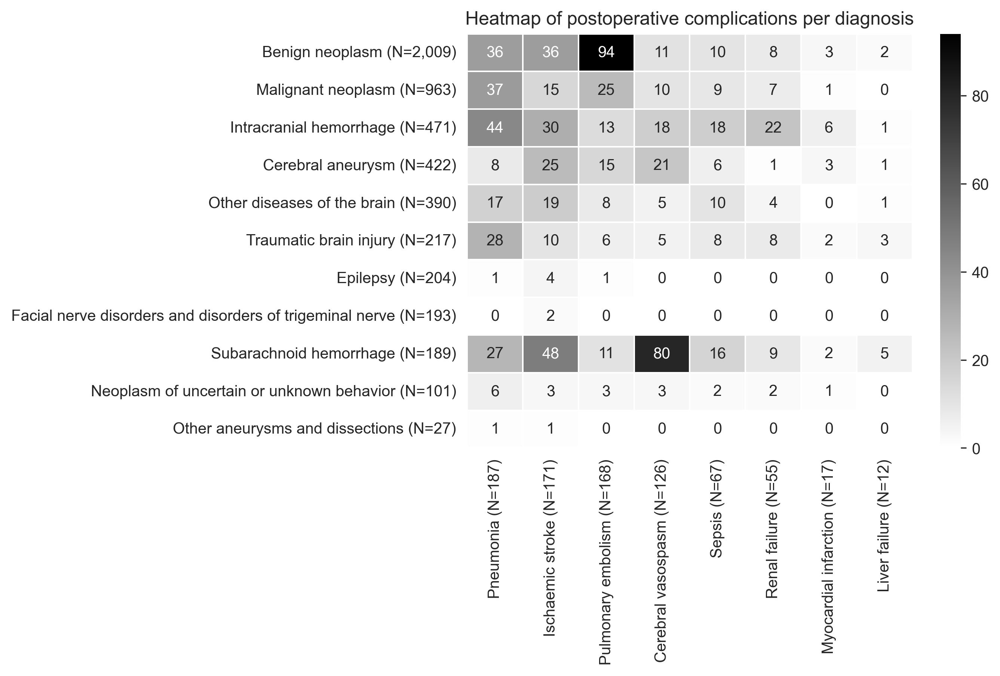

In [13]:
ax = sns.heatmap(sdc5.T, linewidth=0.5, annot=True, cmap = 'gray_r')
plt.savefig("plots/heatmap.png", dpi=300, bbox_inches="tight")
ax.set_title("Heatmap of postoperative complications per diagnosis")

plt.show()

## 3.2 Differences in $paO_2$ and p/F ratio between sexes

In [14]:
pvalue, ph_dunn, effect_sizes = compare_median("norm_auc_paO2", analysis_df, "sex_male")
print(f"\nDifferences between male and female in normalized perioperative auc values: {round(pvalue,4)}.\n\n")

median_fio2_df = pd.DataFrame(
    {
        "median_fio2": list(
            data[data["sex_male"] == True]
            .groupby("identifier")["fio2"]
            .median()
            .values
        )
        + list(
            data[data["sex_male"] == False]
            .groupby("identifier")["fio2"]
            .median()
            .values
        ),
        "sex_male": sum(analysis_df["sex_male"] == True) * [True]
        + sum(analysis_df["sex_male"] == False) * [False],
    }
)
compare_median("median_fio2", median_fio2_df, "sex_male")

median_horowitz_df = pd.DataFrame(
    {
        "median_horowitz": list(
            data[data["sex_male"] == True]
            .groupby("identifier")["horowitz"]
            .median()
            .values
        )
        + list(
            data[data["sex_male"] == False]
            .groupby("identifier")["horowitz"]
            .median()
            .values
        ),
        "sex_male": sum(analysis_df["sex_male"] == True) * [True]
        + sum(analysis_df["sex_male"] == False) * [False],
    }
)
compare_median("median_horowitz", median_horowitz_df, "sex_male")

pvalue, ph_dunn, effect_sizes = compare_median("norm_auc_pf", analysis_df, "sex_male")
print(f"\nDifferences between male and female in normalized perioperative p/F auc values: {round(pvalue,4)}.\n\n")

         norm_auc_paO2               
                median     mean count
sex_male                             
0             221.4527 227.0479  2854
1             206.2754 211.2733  2166
p-value: 0.0

... Post hoc test...
     1    2
1    -  ***
2  ***    -
       1      2
1 1.0000 0.0000
2 0.0000 1.0000

1, 2: Effect size: Hedges' g: 0.35 (small)
[(np.int64(0), np.int64(1), np.float64(0.34552949035658936))]

1, 2: Effect size: Hedges' g: 0.35 (small)

Differences between male and female in normalized perioperative auc values: 0.0.


         median_fio2             
              median   mean count
sex_male                         
False         0.4300 0.4540  2854
True          0.4200 0.4391  2166
p-value: 0.0

... Post hoc test...
     1    2
1    -  ***
2  ***    -
       1      2
1 1.0000 0.0000
2 0.0000 1.0000

1, 2: Effect size: Hedges' g: 0.14 (very small)
[(np.int64(0), np.int64(1), np.float64(0.13614155912595877))]

1, 2: Effect size: Hedges' g: 0.14 (very small)
        

## 3.3 Differences in $paO_2$ per ASA

In [15]:
pvalue, ph_dunn, effect_sizes = compare_median("norm_auc_paO2", analysis_df, "asa", False)
print(
    f"\nDifferences between ASA classes in normalized perioperative auc values: {round(pvalue,4)}.\n\n"
)

    norm_auc_paO2               
           median     mean count
asa                             
1        227.9127 233.5727   255
2        218.2228 222.7500  2143
3        207.3290 213.7089  2175
4        221.4046 230.7889   414
5        221.1013 252.5793    33

... Post hoc test...
     1    2    3    4   5
1    -  ***  ***    *  NS
2  ***    -  ***   NS  NS
3  ***  ***    -  ***   *
4    *   NS  ***    -  NS
5   NS   NS    *   NS   -
       1      2      3      4      5
1 1.0000 0.0006 0.0000 0.0189 0.9828
2 0.0006 1.0000 0.0000 0.4863 0.2266
3 0.0000 0.0000 1.0000 0.0000 0.0107
4 0.0189 0.4863 0.0000 1.0000 0.3196
5 0.9828 0.2266 0.0107 0.3196 1.0000

1, 2: Effect size: Hedges' g: 0.26 (small)

1, 3: Effect size: Hedges' g: 0.44 (small)

1, 4: Effect size: Hedges' g: 0.05 (very small)

1, 5: Effect size: Hedges' g: 0.4 (small)

2, 3: Effect size: Hedges' g: 0.21 (small)

2, 4: Effect size: Hedges' g: 0.17 (very small)

2, 5: Effect size: Hedges' g: 0.7 (moderate)

3, 4: Effect siz

Table 1

In [16]:
asa_labels = {
    0: "ASA I",
    1: "ASA II",
    2: "ASA III",
    3: "ASA IV",
    4: "ASA V"
}
medians = (
    analysis_df
    .groupby("asa")["norm_auc_paO2"]
    .median()
)
medians.index = medians.index.map(lambda x: x - 1)  # remove if already 0–4

effect_dict = {}

for i, j, eff in effect_sizes:
    effect_dict[(int(i), int(j))] = round(eff,2)
    effect_dict[(int(j), int(i))] = round(eff,2)  # symmetric


table1 = pd.DataFrame("", index=range(5), columns=range(5))

for i in range(5):
    for j in range(5):

        if i == j:
            table1.loc[i, j] = "-"
            continue

        p = ph_dunn.iloc[i, j]
        eff = effect_dict[(i, j)]

        # format p-value
        if p < 0.0001:
            p_str = "<0.0001"
        else:
            p_str = f"{p:.4f}"

        table1.loc[i, j] = f"{p_str} ({eff:.2f})"

row_labels = [
    f"{asa_labels[i]} ({int(medians.loc[i])} mmHg)"
    for i in range(5)
]

table1.index = row_labels
table1.columns = row_labels

display(table1)
table1.to_csv("./data/out/table1.csv")

,ASA I (227 mmHg),ASA II (218 mmHg),ASA III (207 mmHg),ASA IV (221 mmHg),ASA V (221 mmHg)
ASA I (227 mmHg),-,0.0006 (0.26),<0.0001 (0.44),0.0189 (0.05),0.9828 (0.40)
ASA II (218 mmHg),0.0006 (0.26),-,<0.0001 (0.21),0.4863 (0.17),0.2266 (0.70)
ASA III (207 mmHg),<0.0001 (0.44),<0.0001 (0.21),-,<0.0001 (0.35),0.0107 (0.85)
ASA IV (221 mmHg),0.0189 (0.05),0.4863 (0.17),<0.0001 (0.35),-,0.3196 (0.34)
ASA V (221 mmHg),0.9828 (0.40),0.2266 (0.70),0.0107 (0.85),0.3196 (0.34),-


## 3.4 Postoperative Complications

In [17]:
table2_data = []

### 3.4.1 Differences in intervention counts

In [18]:
analysis_df['revision'] = analysis_df["intervention_count"] > 1
pvalue, ph_dunn, effect_sizes = compare_median("norm_auc_paO2", analysis_df, "revision")
print(f"\nDifferences between patients with and without revision in normalized perioperative auc values: {round(pvalue,4)}.\n\n")

         norm_auc_paO2               
                median     mean count
revision                             
False         214.1682 220.1846  4794
True          210.3895 221.4504   226
p-value: 0.8336
No significance found.

1, 2: Effect size: Hedges' g: 0.03 (very small)
[(0, 1, np.float64(0.02733016975552083))]

1, 2: Effect size: Hedges' g: 0.03 (very small)

Differences between patients with and without revision in normalized perioperative auc values: 0.8336.




### 3.4.2 Differences in $paO_2$ between deceased and non-deceased patients

In [19]:
pvalue, ph_dunn, effect_sizes = compare_median("norm_auc_paO2", analysis_df, "deceased")
print(f"\nDifferences between deceased and non-deceased patients in normalized perioperative auc values: {round(pvalue,4)}.\n\n")

for c in complications:
    print(c)
    return_table(analysis_df[analysis_df[c]==True], ['deceased'])

         norm_auc_paO2               
                median     mean count
deceased                             
False         214.0649 220.1125  4931
True          212.2762 227.3925    89
p-value: 0.584
No significance found.

1, 2: Effect size: Hedges' g: 0.16 (very small)
[(0, 1, np.float64(0.15722301130138316))]

1, 2: Effect size: Hedges' g: 0.16 (very small)

Differences between deceased and non-deceased patients in normalized perioperative auc values: 0.584.


cerebral_vasospasm
Table that is converted to an array:
deceased
False    119
True       7
dtype: int64
Splitted set that is returned based on 1 dimensions:
[array([119]), array([7])]
liver_failure
Table that is converted to an array:
deceased
False    7
True     5
dtype: int64
Splitted set that is returned based on 1 dimensions:
[array([7]), array([5])]
myocardial_infarction
Table that is converted to an array:
deceased
False    14
True      3
dtype: int64
Splitted set that is returned based on 1 dimensions:
[array([14])

Stratified by diagnosis

In [20]:
for d in diagnoses:
    print(d.upper())
    pvalue, ph_dunn, effect_sizes = compare_median("norm_auc_paO2", analysis_df.loc[analysis_df[d]==True,:], "deceased", False)
    if pvalue<0.05:
        print(f"\nDifferences between deceased and non-deceased patients with {d} in normalized perioperative auc values: {round(pvalue,4)}.\n__________________________________________\n\n")
        
        medians = (
            analysis_df.loc[analysis_df[d]==True,:]
            .groupby("deceased")["norm_auc_paO2"]
            .median()
        )
        table2_data.append([config.get('long_names').get(d), 'Deceased vs. Survivors', f"{int(medians.loc[True])} vs. {int(medians.loc[False])}", "<0.0001" if pvalue < 0.0001 else f"{pvalue:.4f}", f"{effect_sizes[0][-1]:.2f}", {True: "↑ in deceased", False: "↑ in survivors"}[medians.loc[True]>medians.loc[False]]])

BENIGN_NEOPLASM
No significance found.

1, 2: Effect size: Hedges' g: 0.07 (very small)
[(0, 1, np.float64(0.07226659992706248))]

1, 2: Effect size: Hedges' g: 0.07 (very small)
CEREBRAL_ANEURYSM
No significance found.

1, 2: Effect size: Hedges' g: 1.2 (very large)
[(0, 1, np.float64(1.2002849509109528))]

1, 2: Effect size: Hedges' g: 1.2 (very large)
EPILEPSY
No significance found.
[]
INTRACRANIAL_HEMORRHAGE
No significance found.

1, 2: Effect size: Hedges' g: 0.02 (very small)
[(0, 1, np.float64(0.01766156720889192))]

1, 2: Effect size: Hedges' g: 0.02 (very small)
MALIGNANT_NEOPLASM
         norm_auc_paO2               
                median     mean count
deceased                             
False         209.4922 211.6822   949
True          245.0595 253.1452    14

... Post hoc test...
    1   2
1   -  **
2  **   -
       1      2
1 1.0000 0.0011
2 0.0011 1.0000

1, 2: Effect size: Hedges' g: 1.11 (large)
[(np.int64(0), np.int64(1), np.float64(1.1084271266770187))]

1, 2: 

### 3.4.3 Length of stay

In [21]:
print(f"Median LOS: {np.mean(analysis_df['los'])} -> {int(np.ceil(np.mean(analysis_df['los'])))}")
analysis_df['los_prolonged'] = False
analysis_df.loc[analysis_df['los']>np.mean(analysis_df['los']),'los_prolonged'] = True

pvalue, ph_dunn, effect_sizes = compare_median("norm_auc_paO2", analysis_df, "los_prolonged", False)
print(f"\nDifferences between normal and prolonged LOS in normalized perioperative auc values: {round(pvalue,4)}.\n\n")

if pvalue < 0.05:
    medians = (
        analysis_df
        .groupby("los_prolonged")["norm_auc_paO2"]
        .median()
    )
    table2_data.append([f"Prolonged in-hospital stay (≥{int(np.ceil(np.mean(analysis_df['los'])))} days)", 'Normal vs. prolonged stay', f"{int(medians.loc[False])} vs. {int(medians.loc[True])}", "<0.0001" if pvalue < 0.0001 else f"{pvalue:.4f}", f"{effect_sizes[0][-1]:.2f}", {True: "↑ with normal stay", False: "↑ with prolonged stay"}[medians.loc[False]>medians.loc[True]]])


for c in complications:
    cont_table = pd.crosstab(analysis_df["los_prolonged"], analysis_df[c])
    oddsratio, pvalue = stats.fisher_exact(cont_table)

    print(f"{c}: Odds ratio: {round(oddsratio,2)}, p-value: {round(pvalue,4)} (Fisher's Exact Test)")

    statitic, pvalue, dof, expected_freq = stats.chi2_contingency(cont_table.values)
    print(f"{c}: p-value: {round(pvalue,4)} (Chi-square test)\n")

Median LOS: 10.94601593625498 -> 11
              norm_auc_paO2               
                     median     mean count
los_prolonged                             
False              213.0671 218.2980  3584
True               217.0908 225.0924  1436

... Post hoc test...
    1   2
1   -  **
2  **   -
       1      2
1 1.0000 0.0028
2 0.0028 1.0000

1, 2: Effect size: Hedges' g: 0.15 (very small)
[(np.int64(0), np.int64(1), np.float64(0.1470205837880129))]

1, 2: Effect size: Hedges' g: 0.15 (very small)

Differences between normal and prolonged LOS in normalized perioperative auc values: 0.0028.


cerebral_vasospasm: Odds ratio: 8.12, p-value: 0.0 (Fisher's Exact Test)
cerebral_vasospasm: p-value: 0.0 (Chi-square test)

liver_failure: Odds ratio: 12.56, p-value: 0.0001 (Fisher's Exact Test)
liver_failure: p-value: 0.0001 (Chi-square test)

myocardial_infarction: Odds ratio: 8.18, p-value: 0.0001 (Fisher's Exact Test)
myocardial_infarction: p-value: 0.0 (Chi-square test)

pneumonia: Od

#### 3.4.3.1 LOS per ASA

In [22]:
print("\nPer ASA")
for asa in range(1,6):
    print(f"ASA {asa}")
    pvalue, ph_dunn, effect_sizes = compare_median("norm_auc_paO2", analysis_df.loc[analysis_df.asa == asa, :], "los_prolonged", False)
    if pvalue<0.05:
        print(f"\nDifferences between normal and prolonged LOS in normalized perioperative auc values for ASA {asa}: {round(pvalue,4)}.\n__________________________________________\n\n")

        medians = (
            analysis_df.loc[analysis_df.asa == asa, :]
            .groupby("los_prolonged")["norm_auc_paO2"]
            .median()
        )
        table2_data.append([f"Prolonged in-hospital stay, ASA {asa}", 'Normal vs. prolonged stay', f"{int(medians.loc[False])} vs. {int(medians.loc[True])}", "<0.0001" if pvalue < 0.0001 else f"{pvalue:.4f}", f"{effect_sizes[0][-1]:.2f}", {True: "↑ with normal stay", False: "↑ with prolonged stay"}[medians.loc[False]>medians.loc[True]]])


Per ASA
ASA 1
No significance found.

1, 2: Effect size: Hedges' g: 0.24 (small)
[(0, 1, np.float64(0.23894543799200413))]

1, 2: Effect size: Hedges' g: 0.24 (small)
ASA 2
No significance found.

1, 2: Effect size: Hedges' g: 0.03 (very small)
[(0, 1, np.float64(0.02822746943438506))]

1, 2: Effect size: Hedges' g: 0.03 (very small)
ASA 3
              norm_auc_paO2               
                     median     mean count
los_prolonged                             
False              204.3847 210.5713  1496
True               214.3431 220.6217   679

... Post hoc test...
     1    2
1    -  ***
2  ***    -
       1      2
1 1.0000 0.0000
2 0.0000 1.0000

1, 2: Effect size: Hedges' g: 0.22 (small)
[(np.int64(0), np.int64(1), np.float64(0.22349945013922357))]

1, 2: Effect size: Hedges' g: 0.22 (small)

Differences between normal and prolonged LOS in normalized perioperative auc values for ASA 3: 0.0.
__________________________________________


ASA 4
No significance found.

1, 2: Effe

#### 3.4.3.2 LOS per sex

In [23]:
for sex in [True, False]:
    print(f"{ {True: 'Male', False: 'Female'}[sex]} patients:")
    pvalue, ph_dunn, effect_sizes = compare_median("norm_auc_paO2", analysis_df.loc[analysis_df.sex_male == sex, :], "los_prolonged", False)
    if pvalue<0.05:
        print(f"\nDifferences between normal and prolonged LOS in normalized perioperative auc values for { {True: 'male', False: 'female'}[sex] } patients: {round(pvalue,4)}.\n__________________________________________\n\n")

        medians = (
            analysis_df.loc[analysis_df.sex_male == sex, :]
            .groupby("los_prolonged")["norm_auc_paO2"]
            .median()
        )
        table2_data.append([f"Prolonged in-hospital stay, { {True: 'males', False: 'females'}[sex] }", 'Normal vs. prolonged stay', f"{int(medians.loc[False])} vs. {int(medians.loc[True])}", "<0.0001" if pvalue < 0.0001 else f"{pvalue:.4f}", f"{effect_sizes[0][-1]:.2f}", {True: "↑ with normal stay", False: "↑ with prolonged stay"}[medians.loc[False]>medians.loc[True]]])

Male patients:
No significance found.

1, 2: Effect size: Hedges' g: 0.13 (very small)
[(0, 1, np.float64(0.12872642117805333))]

1, 2: Effect size: Hedges' g: 0.13 (very small)
Female patients:
              norm_auc_paO2               
                     median     mean count
los_prolonged                             
False              219.5967 224.4667  2110
True               226.5587 234.3682   744

... Post hoc test...
     1    2
1    -  ***
2  ***    -
       1      2
1 1.0000 0.0002
2 0.0002 1.0000

1, 2: Effect size: Hedges' g: 0.21 (small)
[(np.int64(0), np.int64(1), np.float64(0.21214180249960626))]

1, 2: Effect size: Hedges' g: 0.21 (small)

Differences between normal and prolonged LOS in normalized perioperative auc values for female patients: 0.0002.
__________________________________________




#### 3.4.3.3 LOS per diagnosis

In [24]:
for d in diagnoses:
    tmp_df = analysis_df.loc[analysis_df[d]==True,:]
    print(f"{d.upper()}")
    print(f"Median LOS: {np.mean(tmp_df['los'])} -> {int(np.ceil(np.mean(tmp_df['los'])))}")
    tmp_df.loc[:,'los_prolonged'] = False
    tmp_df.loc[tmp_df['los']>np.mean(tmp_df['los']),'los_prolonged'] = True

    pvalue, ph_dunn, effect_sizes = compare_median("norm_auc_paO2", tmp_df, "los_prolonged", False)
    print(f"\nDifferences between normal and prolonged LOS in normalized perioperative auc values: {pvalue:.4f}.\n\n")
 
    if pvalue < 0.05:
        medians = (
            tmp_df
            .groupby("los_prolonged")["norm_auc_paO2"]
            .median()
        )
        table2_data.append([f"{config.get('long_names').get(d)}, prolonged in-hospital stay (≥{int(np.ceil(np.mean(tmp_df['los'])))} days)", 'Normal vs. prolonged stay', f"{int(medians.loc[False])} vs. {int(medians.loc[True])}", "<0.0001" if pvalue < 0.0001 else f"{pvalue:.4f}", f"{effect_sizes[0][-1]:.2f}", {True: "↑ with normal stay", False: "↑ with prolonged stay"}[medians.loc[False]>medians.loc[True]]])



BENIGN_NEOPLASM
Median LOS: 9.196117471378795 -> 10
No significance found.

1, 2: Hedges' g <0.01
[(0, 1, np.float64(0.008713740272868614))]

1, 2: Hedges' g <0.01

Differences between normal and prolonged LOS in normalized perioperative auc values: 0.9927.


CEREBRAL_ANEURYSM
Median LOS: 10.772511848341232 -> 11
              norm_auc_paO2               
                     median     mean count
los_prolonged                             
False              271.5658 273.3996   304
True               279.8774 283.4552   118

... Post hoc test...
   1  2
1  -  *
2  *  -
       1      2
1 1.0000 0.0250
2 0.0250 1.0000

1, 2: Effect size: Hedges' g: 0.25 (small)
[(np.int64(0), np.int64(1), np.float64(0.2496866383131466))]

1, 2: Effect size: Hedges' g: 0.25 (small)

Differences between normal and prolonged LOS in normalized perioperative auc values: 0.0250.


EPILEPSY
Median LOS: 9.200980392156863 -> 10
No significance found.

1, 2: Effect size: Hedges' g: 0.15 (very small)
[(0, 1, np.flo

### 3.4.4 Differences in $paO_2$ between post-op Complications (and per sex)

In [25]:
sign_complications = []

for c in complications:
    print(f"\n{c.upper()}")
    print(f"Prevalence: {round(100/analysis_df.shape[0]*analysis_df[analysis_df[c]==True].shape[0],1)} %")
    pvalue, ph_dunn, effect_sizes = compare_median("norm_auc_paO2", analysis_df, c, False)
    print(f"\nDifferences between patients with and without {c} in normalized perioperative auc values: {round(pvalue,4)}.")

    if pvalue < 0.05:
        sign_complications.append(c)

        medians = (
            analysis_df
            .groupby(c)["norm_auc_paO2"]
            .median()
        )
        table2_data.append([config.get("long_names").get(c), 'With vs. without', f"{int(medians.loc[True])} vs. {int(medians.loc[False])}", "<0.0001" if pvalue < 0.0001 else f"{pvalue:.4f}", f"{effect_sizes[0][-1]:.2f}", {True: f"↑ with {config.get('long_names').get(c)}", False:f"↓ with {config.get('long_names').get(c)}"}[medians.loc[True]>medians.loc[False]]])

        for v in [True, False]:
            sex = {True: "male", False: "female"}
            print("\n__________________________________________\n",sex.get(v).upper())
            print(f"Prevalence: {round(100/analysis_df.loc[analysis_df['sex_male']==v,:].shape[0]*analysis_df[(analysis_df[c]==True)&(analysis_df['sex_male']==v)].shape[0],1)} %")
            pvalue, ph_dunn, effect_sizes = compare_median("norm_auc_paO2", analysis_df.loc[analysis_df["sex_male"]==v,:], c, True)
            if pvalue<0.05:
                print(f"\nDifferences between patients with and without {c} in normalized perioperative auc values for {sex.get(v)} patients: {round(pvalue,4)}.")

                medians = (
                    analysis_df.loc[analysis_df["sex_male"]==v,:]
                    .groupby(c)["norm_auc_paO2"]
                    .median()
                )
                table2_data.append([f"{config.get('long_names').get(c)}, { {True: 'males', False: 'females'}[v] }", 'With vs. without', f"{int(medians.loc[True])} vs. {int(medians.loc[False])}", "<0.0001" if pvalue < 0.0001 else f"{pvalue:.4f}", f"{effect_sizes[0][-1]:.2f}", {True: f"↑ with {config.get('long_names').get(c)}", False:f"↓ with {config.get('long_names').get(c)}"}[medians.loc[True]>medians.loc[False]]])


    print("\n__________________________________________\n__________________________________________\n\n")

print(f"Significant results were observed in {', '.join(sign_complications)}.")


CEREBRAL_VASOSPASM
Prevalence: 2.5 %
                   norm_auc_paO2               
                          median     mean count
cerebral_vasospasm                             
False                   213.5144 219.3478  4894
True                    251.0453 254.9567   126

... Post hoc test...
     1    2
1    -  ***
2  ***    -
       1      2
1 1.0000 0.0000
2 0.0000 1.0000

1, 2: Effect size: Hedges' g: 0.77 (moderate)
[(np.int64(0), np.int64(1), np.float64(0.7745511298876815))]

1, 2: Effect size: Hedges' g: 0.77 (moderate)

Differences between patients with and without cerebral_vasospasm in normalized perioperative auc values: 0.0.

__________________________________________
 MALE
Prevalence: 2.5 %
                   norm_auc_paO2               
                          median     mean count
cerebral_vasospasm                             
False                   205.8863 210.8583  2112
True                    219.5177 227.5034    54
p-value: 0.1318
No significance found.

1,

/var/folders/ff/zlqg1pks12q23nf7rf3m7j3r0000gn/T/ipykernel_61978/3849223173.py:6: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  analysis_df['paO2_bin'] = analysis_df['paO2_bin'].replace({k:v for k,v in zip(['low', 'mid-low', 'mid', 'mid-high', 'high'], new_labels)})
/var/folders/ff/zlqg1pks12q23nf7rf3m7j3r0000gn/T/ipykernel_61978/3849223173.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  comp_rate = analysis_df.groupby('paO2_bin')[list(complications)].mean()


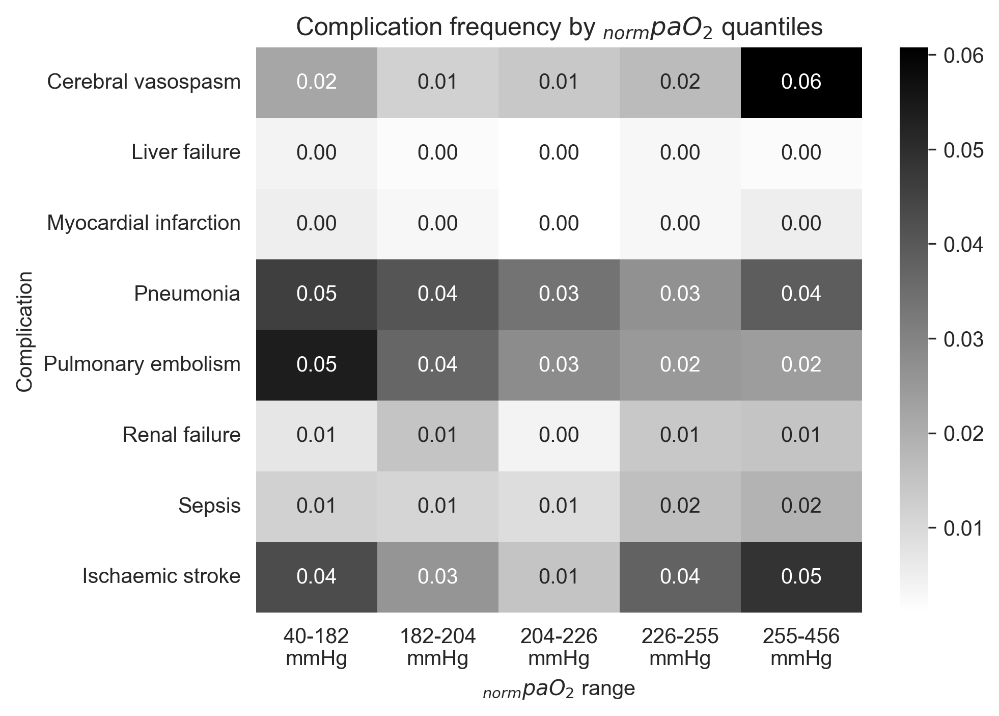

In [26]:
analysis_df['paO2_bin'], edges = pd.qcut(analysis_df['norm_auc_paO2'], q=5, labels=['low', 'mid-low', 'mid', 'mid-high', 'high'], retbins = True)
new_labels = []
for i, label in enumerate(['low', 'mid-low', 'mid', 'mid-high', 'high']):
    new_labels.append(f"""{round(edges[i])}-{round(edges[i+1])}\nmmHg""")

analysis_df['paO2_bin'] = analysis_df['paO2_bin'].replace({k:v for k,v in zip(['low', 'mid-low', 'mid', 'mid-high', 'high'], new_labels)})


comp_rate = analysis_df.groupby('paO2_bin')[list(complications)].mean()

ax = sns.heatmap(comp_rate.T, cmap = 'gray_r', annot=True, fmt=".2f")
ax.set_yticklabels([config.get('long_names')[i] for i in complications])
plt.xlabel("$_{norm}paO_2$ range")
plt.ylabel("Complication")
plt.savefig("plots/complication_frequency.png", dpi=300, bbox_inches="tight")
plt.title("Complication frequency by $_{norm}paO_2$ quantiles")

plt.show()

### 3.4.5 Differences in $paO_2$ between post-op Complications per Diagnosis

[40, 176, 196, 213, 237, 385]


/var/folders/ff/zlqg1pks12q23nf7rf3m7j3r0000gn/T/ipykernel_61978/948302734.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  comp_rate = tmp_df.groupby('paO2_bin')[list(complications)].mean()


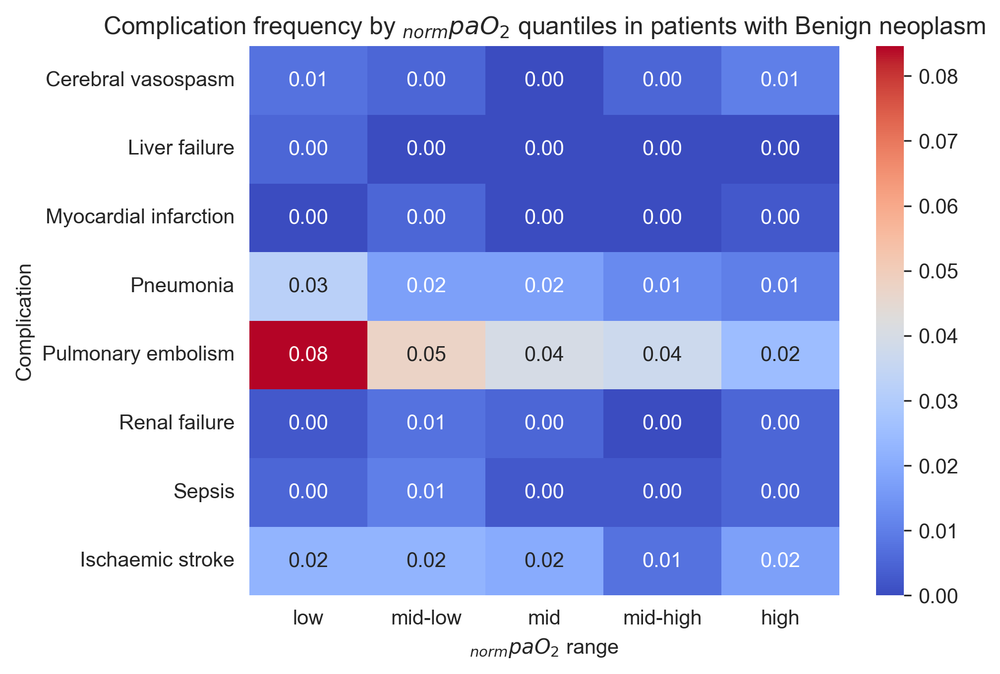


BENIGN_NEOPLASM -- CEREBRAL_VASOSPASM
Prevalence: 0.5 %
No significance found.

1, 2: Effect size: Hedges' g: 0.32 (small)
[(0, 1, np.float64(0.3191135666520716))]

1, 2: Effect size: Hedges' g: 0.32 (small)

BENIGN_NEOPLASM -- LIVER_FAILURE
Prevalence: 0.1 %
No significance found.

1, 2: Effect size: Hedges' g: 1.21 (very large)
[(0, 1, np.float64(1.2136415400335094))]

1, 2: Effect size: Hedges' g: 1.21 (very large)

BENIGN_NEOPLASM -- MYOCARDIAL_INFARCTION
Prevalence: 0.1 %
No significance found.

1, 2: Effect size: Hedges' g: 0.09 (very small)
[(0, 1, np.float64(0.09484219904797594))]

1, 2: Effect size: Hedges' g: 0.09 (very small)

BENIGN_NEOPLASM -- PNEUMONIA
Prevalence: 1.8 %
          norm_auc_paO2               
                 median     mean count
pneumonia                             
False          204.9210 207.1998  1973
True           184.3670 192.5915    36

... Post hoc test...
    1   2
1   -  **
2  **   -
       1      2
1 1.0000 0.0099
2 0.0099 1.0000

1, 2: Effe

/var/folders/ff/zlqg1pks12q23nf7rf3m7j3r0000gn/T/ipykernel_61978/948302734.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  comp_rate = tmp_df.groupby('paO2_bin')[list(complications)].mean()


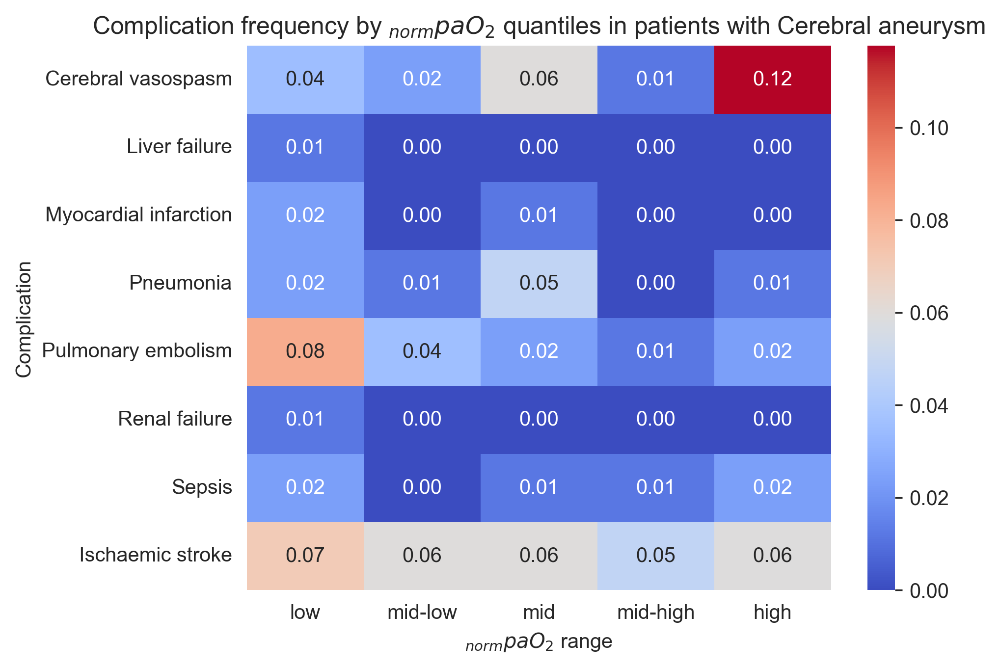


CEREBRAL_ANEURYSM -- CEREBRAL_VASOSPASM
Prevalence: 5.0 %
                   norm_auc_paO2               
                          median     mean count
cerebral_vasospasm                             
False                   273.0480 274.7388   401
True                    285.7723 304.3298    21

... Post hoc test...
    1   2
1   -  **
2  **   -
       1      2
1 1.0000 0.0100
2 0.0100 1.0000

1, 2: Effect size: Hedges' g: 0.74 (moderate)
[(np.int64(0), np.int64(1), np.float64(0.7399706984091916))]

1, 2: Effect size: Hedges' g: 0.74 (moderate)

Differences between patients with and without cerebral_vasospasm in normalized perioperative auc values: 0.01.
__________________________________________



CEREBRAL_ANEURYSM -- LIVER_FAILURE
Prevalence: 0.2 %
No significance found.

1, 2: Effect size: Hedges' g: 1.2 (very large)
[(0, 1, np.float64(1.2002849509109528))]

1, 2: Effect size: Hedges' g: 1.2 (very large)

CEREBRAL_ANEURYSM -- MYOCARDIAL_INFARCTION
Prevalence: 0.7 %
No significan

/var/folders/ff/zlqg1pks12q23nf7rf3m7j3r0000gn/T/ipykernel_61978/948302734.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  comp_rate = tmp_df.groupby('paO2_bin')[list(complications)].mean()


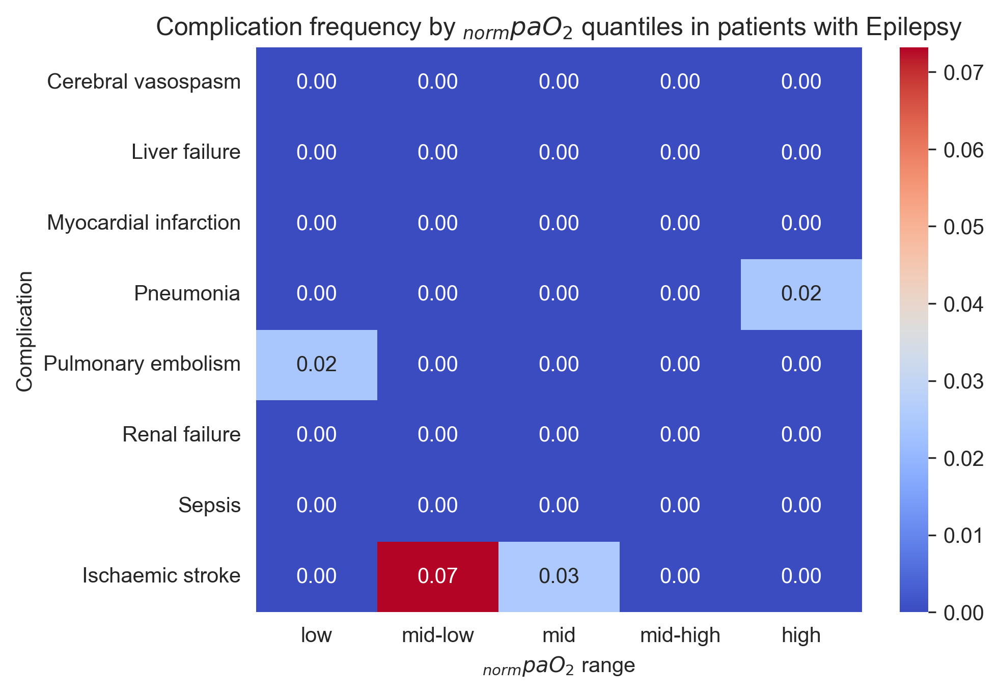


EPILEPSY -- CEREBRAL_VASOSPASM
Prevalence: 0.0 %
No significance found.
[]

EPILEPSY -- LIVER_FAILURE
Prevalence: 0.0 %
No significance found.
[]

EPILEPSY -- MYOCARDIAL_INFARCTION
Prevalence: 0.0 %
No significance found.


/var/folders/ff/zlqg1pks12q23nf7rf3m7j3r0000gn/T/ipykernel_61978/948302734.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  comp_rate = tmp_df.groupby('paO2_bin')[list(complications)].mean()


[]

EPILEPSY -- PNEUMONIA
Prevalence: 0.5 %
No significance found.

1, 2: Effect size: Hedges' g: 2.8 (huge)
[(0, 1, np.float64(2.7989915380541137))]

1, 2: Effect size: Hedges' g: 2.8 (huge)

EPILEPSY -- PULMONARY_EMBOLISM
Prevalence: 0.5 %
No significance found.

1, 2: Effect size: Hedges' g: 1.6 (very large)
[(0, 1, np.float64(1.6018221576420335))]

1, 2: Effect size: Hedges' g: 1.6 (very large)

EPILEPSY -- RENAL_FAILURE
Prevalence: 0.0 %
No significance found.
[]

EPILEPSY -- SEPSIS
Prevalence: 0.0 %
No significance found.
[]

EPILEPSY -- STROKE
Prevalence: 2.0 %
No significance found.

1, 2: Effect size: Hedges' g: 0.52 (moderate)
[(0, 1, np.float64(0.5239230525059982))]

1, 2: Effect size: Hedges' g: 0.52 (moderate)
[112, 184, 206, 229, 255, 438]


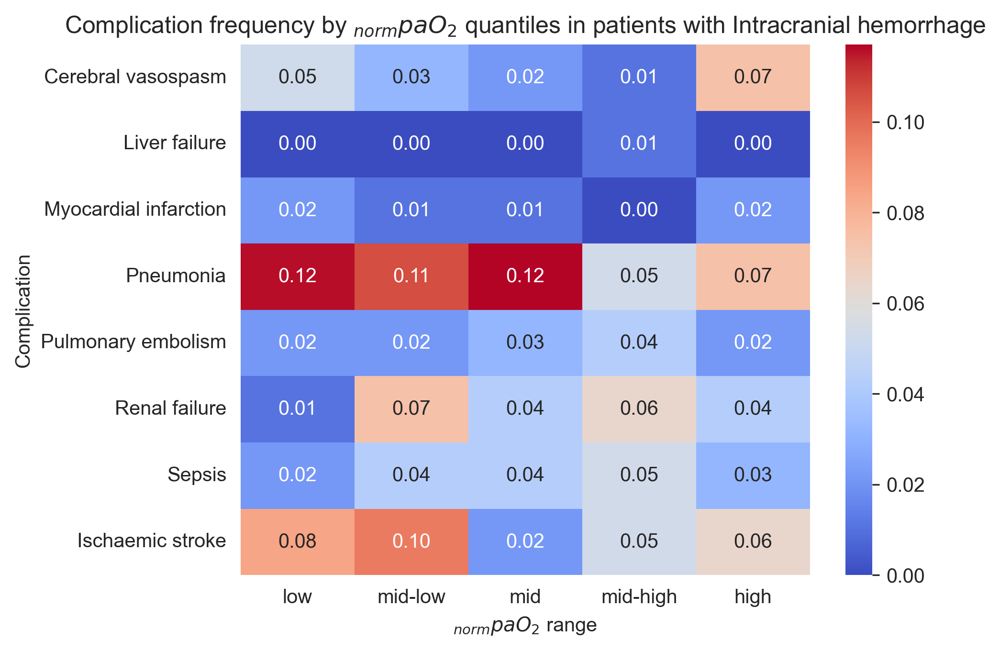


INTRACRANIAL_HEMORRHAGE -- CEREBRAL_VASOSPASM
Prevalence: 3.8 %
No significance found.

1, 2: Effect size: Hedges' g: 0.52 (moderate)
[(0, 1, np.float64(0.5201862780851912))]

1, 2: Effect size: Hedges' g: 0.52 (moderate)

INTRACRANIAL_HEMORRHAGE -- LIVER_FAILURE
Prevalence: 0.2 %
No significance found.

1, 2: Effect size: Hedges' g: 0.46 (small)
[(0, 1, np.float64(0.4552538068587843))]

1, 2: Effect size: Hedges' g: 0.46 (small)

INTRACRANIAL_HEMORRHAGE -- MYOCARDIAL_INFARCTION
Prevalence: 1.3 %
No significance found.

1, 2: Effect size: Hedges' g: 0.21 (small)
[(0, 1, np.float64(0.21373846088066162))]

1, 2: Effect size: Hedges' g: 0.21 (small)

INTRACRANIAL_HEMORRHAGE -- PNEUMONIA
Prevalence: 9.3 %
No significance found.

1, 2: Effect size: Hedges' g: 0.25 (small)
[(0, 1, np.float64(0.24614548037428421))]

1, 2: Effect size: Hedges' g: 0.25 (small)

INTRACRANIAL_HEMORRHAGE -- PULMONARY_EMBOLISM
Prevalence: 2.8 %
No significance found.

1, 2: Effect size: Hedges' g: 0.19 (very small

/var/folders/ff/zlqg1pks12q23nf7rf3m7j3r0000gn/T/ipykernel_61978/948302734.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  comp_rate = tmp_df.groupby('paO2_bin')[list(complications)].mean()


[106, 182, 201, 218, 242, 398]


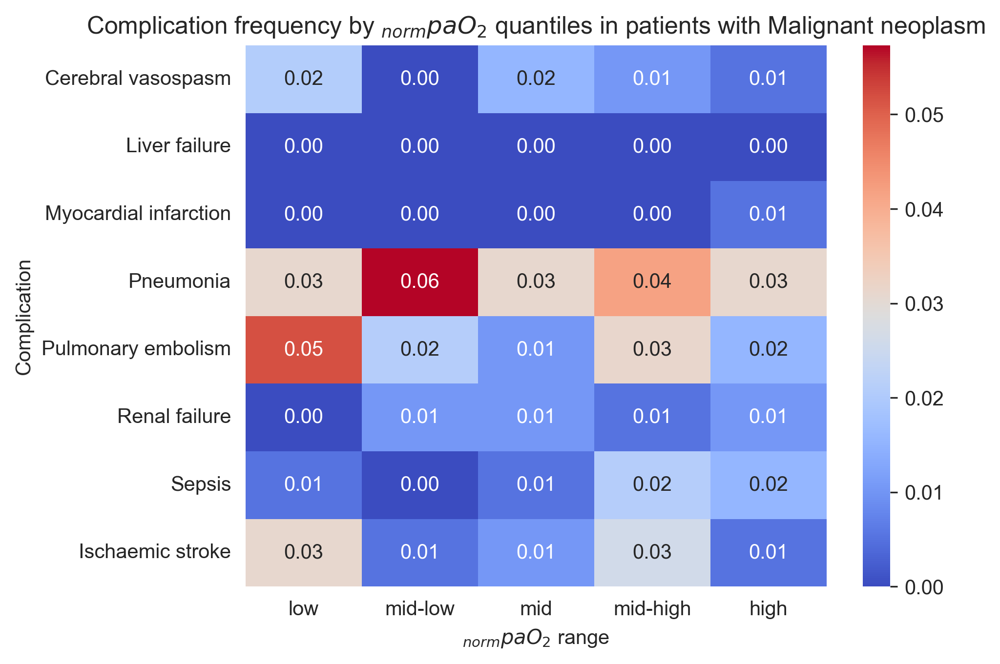


MALIGNANT_NEOPLASM -- CEREBRAL_VASOSPASM
Prevalence: 1.0 %
No significance found.

1, 2: Effect size: Hedges' g: 0.53 (moderate)
[(0, 1, np.float64(0.5312753874661832))]

1, 2: Effect size: Hedges' g: 0.53 (moderate)

MALIGNANT_NEOPLASM -- LIVER_FAILURE
Prevalence: 0.0 %
No significance found.
[]

MALIGNANT_NEOPLASM -- MYOCARDIAL_INFARCTION
Prevalence: 0.1 %
No significance found.

1, 2: Effect size: Hedges' g: 0.9 (large)
[(0, 1, np.float64(0.896279002743954))]

1, 2: Effect size: Hedges' g: 0.9 (large)

MALIGNANT_NEOPLASM -- PNEUMONIA
Prevalence: 3.8 %
No significance found.

1, 2: Effect size: Hedges' g: 0.09 (very small)
[(0, 1, np.float64(0.08634083257866107))]

1, 2: Effect size: Hedges' g: 0.09 (very small)

MALIGNANT_NEOPLASM -- PULMONARY_EMBOLISM
Prevalence: 2.6 %
No significance found.

1, 2: Effect size: Hedges' g: 0.34 (small)
[(0, 1, np.float64(0.33816069545257516))]

1, 2: Effect size: Hedges' g: 0.34 (small)

MALIGNANT_NEOPLASM -- RENAL_FAILURE
Prevalence: 0.7 %
No sign

/var/folders/ff/zlqg1pks12q23nf7rf3m7j3r0000gn/T/ipykernel_61978/948302734.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  comp_rate = tmp_df.groupby('paO2_bin')[list(complications)].mean()


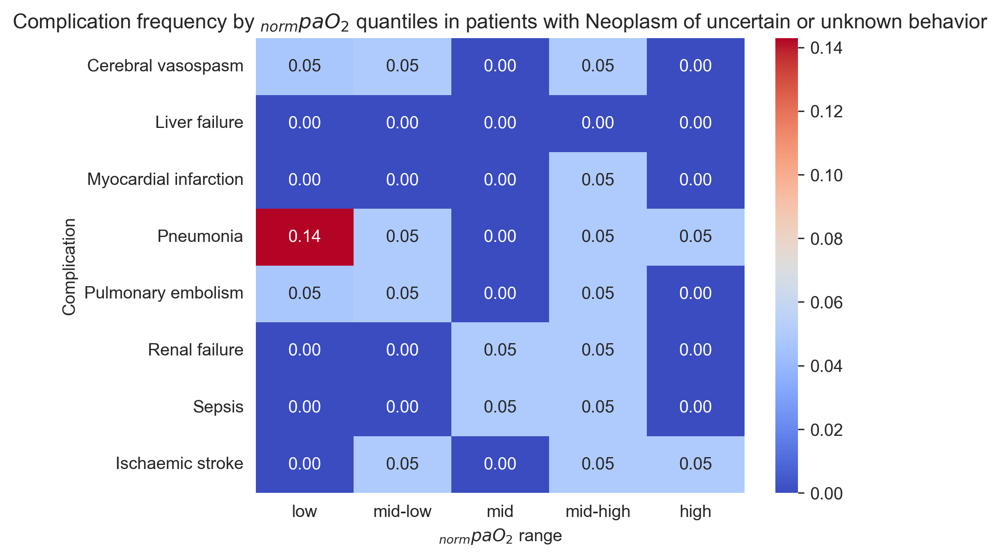


NEOPLASM -- CEREBRAL_VASOSPASM
Prevalence: 3.0 %
No significance found.

1, 2: Effect size: Hedges' g: 0.33 (small)
[(0, 1, np.float64(0.32553058948749153))]

1, 2: Effect size: Hedges' g: 0.33 (small)

NEOPLASM -- LIVER_FAILURE
Prevalence: 0.0 %
No significance found.
[]

NEOPLASM -- MYOCARDIAL_INFARCTION
Prevalence: 1.0 %
No significance found.

1, 2: Effect size: Hedges' g: 0.69 (moderate)
[(0, 1, np.float64(0.6909775553250591))]

1, 2: Effect size: Hedges' g: 0.69 (moderate)

NEOPLASM -- PNEUMONIA
Prevalence: 5.9 %
No significance found.

1, 2: Effect size: Hedges' g: 0.08 (very small)
[(0, 1, np.float64(0.08039603702161437))]

1, 2: Effect size: Hedges' g: 0.08 (very small)

NEOPLASM -- PULMONARY_EMBOLISM
Prevalence: 3.0 %
No significance found.

1, 2: Effect size: Hedges' g: 0.64 (moderate)
[(0, 1, np.float64(0.6438081214287573))]

1, 2: Effect size: Hedges' g: 0.64 (moderate)

NEOPLASM -- RENAL_FAILURE
Prevalence: 2.0 %
No significance found.

1, 2: Effect size: Hedges' g: 0.27

/var/folders/ff/zlqg1pks12q23nf7rf3m7j3r0000gn/T/ipykernel_61978/948302734.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  comp_rate = tmp_df.groupby('paO2_bin')[list(complications)].mean()


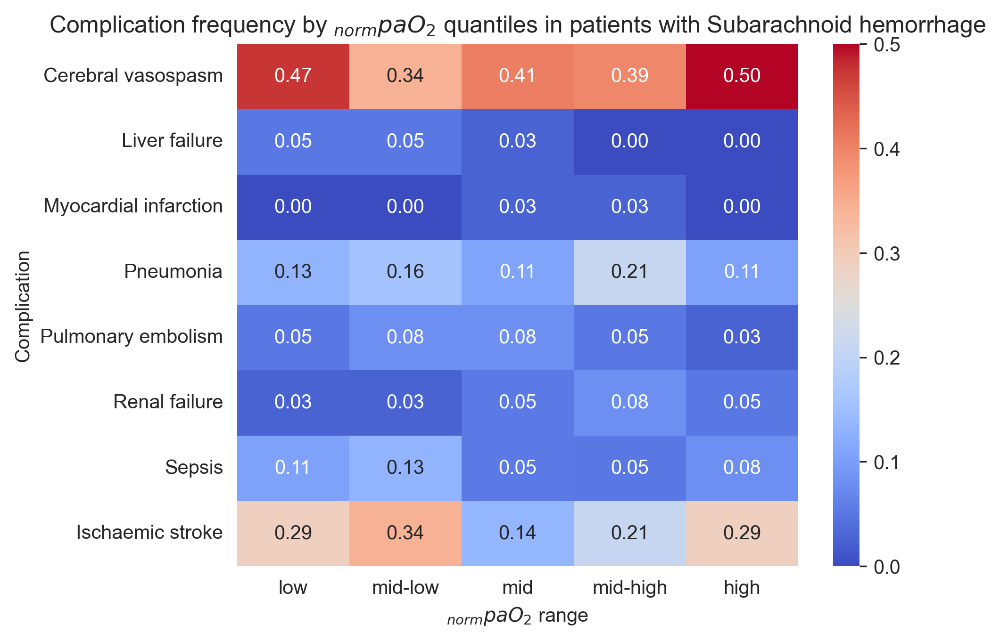


SAH -- CEREBRAL_VASOSPASM
Prevalence: 42.3 %
No significance found.

1, 2: Effect size: Hedges' g: 0.04 (very small)
[(0, 1, np.float64(0.03680368920906017))]

1, 2: Effect size: Hedges' g: 0.04 (very small)

SAH -- LIVER_FAILURE
Prevalence: 2.6 %
              norm_auc_paO2               
                     median     mean count
liver_failure                             
False              275.1263 273.1118   184
True               224.9450 214.6400     5

... Post hoc test...
   1  2
1  -  *
2  *  -
       1      2
1 1.0000 0.0299
2 0.0299 1.0000

1, 2: Effect size: Hedges' g: 0.89 (large)
[(np.int64(0), np.int64(1), np.float64(0.8877216324035982))]

1, 2: Effect size: Hedges' g: 0.89 (large)

Differences between patients with and without liver_failure in normalized perioperative auc values: 0.0299.
__________________________________________



SAH -- MYOCARDIAL_INFARCTION
Prevalence: 1.1 %
No significance found.

1, 2: Effect size: Hedges' g: 0.16 (very small)
[(0, 1, np.float64(

/var/folders/ff/zlqg1pks12q23nf7rf3m7j3r0000gn/T/ipykernel_61978/948302734.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  comp_rate = tmp_df.groupby('paO2_bin')[list(complications)].mean()


Prevalence: 5.8 %
No significance found.

1, 2: Effect size: Hedges' g: 0.13 (very small)
[(0, 1, np.float64(0.12737873835654187))]

1, 2: Effect size: Hedges' g: 0.13 (very small)

SAH -- RENAL_FAILURE
Prevalence: 4.8 %
No significance found.

1, 2: Effect size: Hedges' g: 0.18 (very small)
[(0, 1, np.float64(0.1770758462383969))]

1, 2: Effect size: Hedges' g: 0.18 (very small)

SAH -- SEPSIS
Prevalence: 8.5 %
No significance found.

1, 2: Effect size: Hedges' g: 0.35 (small)
[(0, 1, np.float64(0.34823241898450347))]

1, 2: Effect size: Hedges' g: 0.35 (small)

SAH -- STROKE
Prevalence: 25.4 %
No significance found.

1, 2: Effect size: Hedges' g: 0.13 (very small)
[(0, 1, np.float64(0.13236857356993245))]

1, 2: Effect size: Hedges' g: 0.13 (very small)
[113, 175, 201, 222, 255, 456]


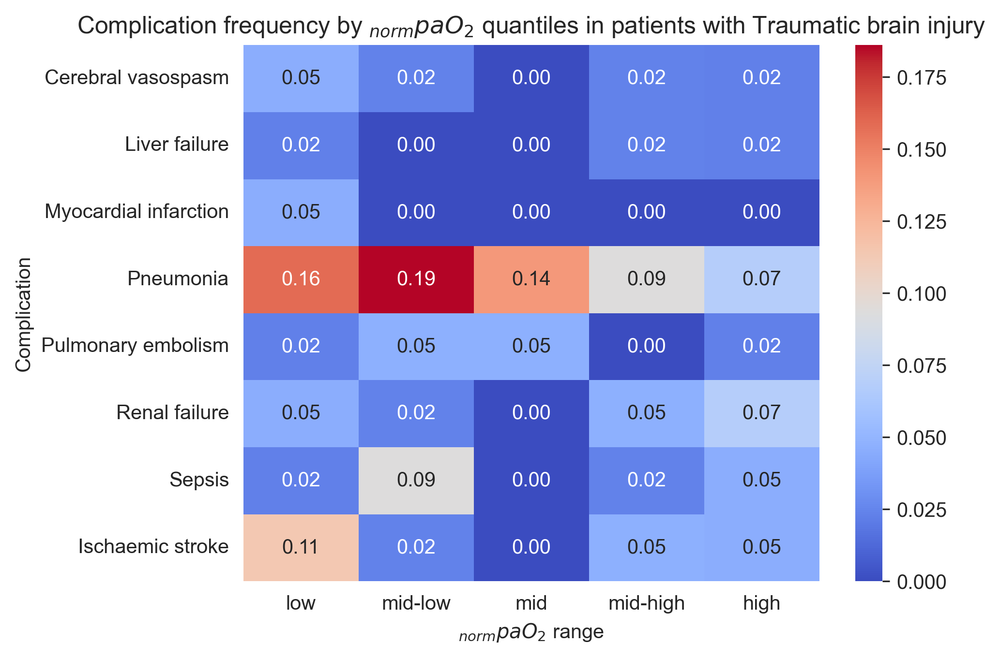


TBI -- CEREBRAL_VASOSPASM
Prevalence: 2.3 %
No significance found.

1, 2: Effect size: Hedges' g: 0.44 (small)
[(0, 1, np.float64(0.44222246376992813))]

1, 2: Effect size: Hedges' g: 0.44 (small)

TBI -- LIVER_FAILURE
Prevalence: 1.4 %
No significance found.

1, 2: Effect size: Hedges' g: 0.07 (very small)
[(0, 1, np.float64(0.07160063565559514))]

1, 2: Effect size: Hedges' g: 0.07 (very small)

TBI -- MYOCARDIAL_INFARCTION
Prevalence: 0.9 %
No significance found.

1, 2: Effect size: Hedges' g: 1.16 (large)
[(0, 1, np.float64(1.1590573726506952))]

1, 2: Effect size: Hedges' g: 1.16 (large)

TBI -- PNEUMONIA
Prevalence: 12.9 %
No significance found.

1, 2: Effect size: Hedges' g: 0.28 (small)
[(0, 1, np.float64(0.2833701533138897))]

1, 2: Effect size: Hedges' g: 0.28 (small)

TBI -- PULMONARY_EMBOLISM
Prevalence: 2.8 %
No significance found.

1, 2: Hedges' g <0.01
[(0, 1, np.float64(0.0016356340974325128))]

1, 2: Hedges' g <0.01

TBI -- RENAL_FAILURE
Prevalence: 3.7 %
No significa

/var/folders/ff/zlqg1pks12q23nf7rf3m7j3r0000gn/T/ipykernel_61978/948302734.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  comp_rate = tmp_df.groupby('paO2_bin')[list(complications)].mean()


No significance found.

1, 2: Effect size: Hedges' g: 0.36 (small)
[(0, 1, np.float64(0.3633208480300012))]

1, 2: Effect size: Hedges' g: 0.36 (small)
[132, 182, 212, 232, 264, 358]


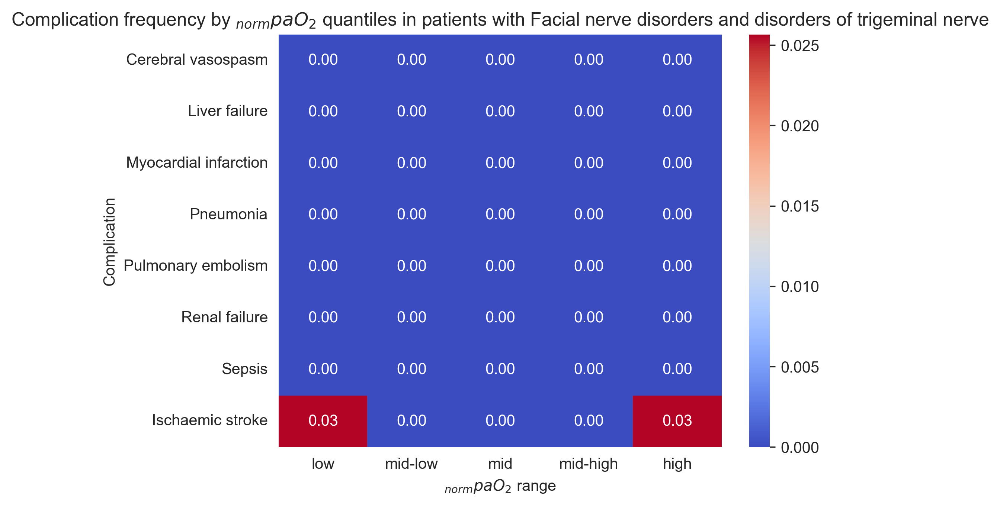


TRIGEMINUS -- CEREBRAL_VASOSPASM
Prevalence: 0.0 %
No significance found.
[]

TRIGEMINUS -- LIVER_FAILURE
Prevalence: 0.0 %
No significance found.
[]

TRIGEMINUS -- MYOCARDIAL_INFARCTION
Prevalence: 0.0 %
No significance found.
[]

TRIGEMINUS -- PNEUMONIA
Prevalence: 0.0 %
No significance found.
[]

TRIGEMINUS -- PULMONARY_EMBOLISM
Prevalence: 0.0 %
No significance found.
[]

TRIGEMINUS -- RENAL_FAILURE
Prevalence: 0.0 %
No significance found.
[]

TRIGEMINUS -- SEPSIS
Prevalence: 0.0 %
No significance found.
[]

TRIGEMINUS -- STROKE
Prevalence: 1.0 %
No significance found.

1, 2: Effect size: Hedges' g: 0.25 (small)
[(0, 1, np.float64(0.25014775884093576))]

1, 2: Effect size: Hedges' g: 0.25 (small)
[161, 265, 276, 295, 315, 327]


/var/folders/ff/zlqg1pks12q23nf7rf3m7j3r0000gn/T/ipykernel_61978/948302734.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  comp_rate = tmp_df.groupby('paO2_bin')[list(complications)].mean()


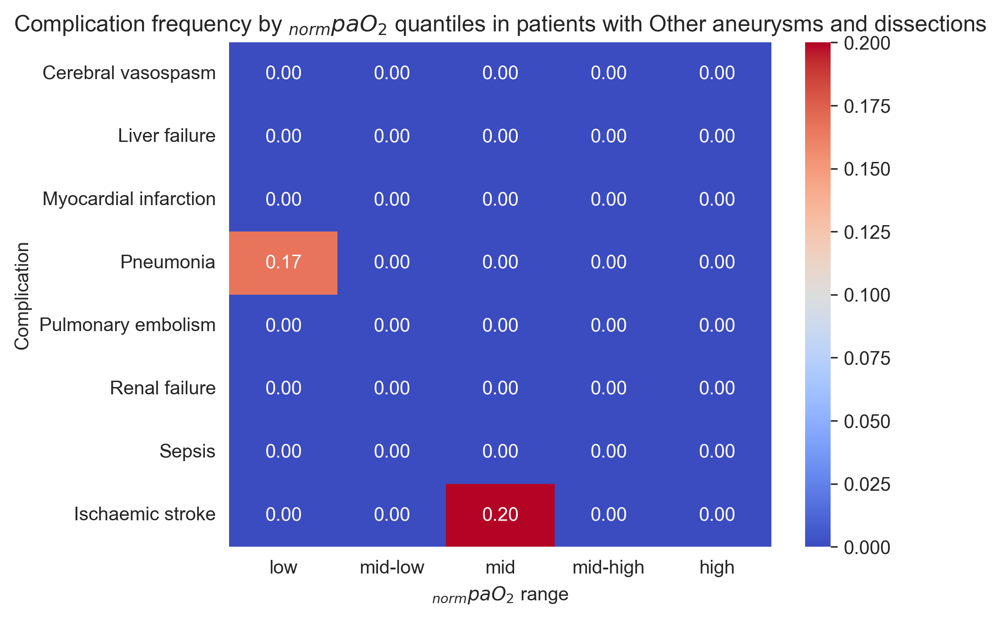

/var/folders/ff/zlqg1pks12q23nf7rf3m7j3r0000gn/T/ipykernel_61978/948302734.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  comp_rate = tmp_df.groupby('paO2_bin')[list(complications)].mean()



OTHER_ANEURYSM_DISSECTION -- CEREBRAL_VASOSPASM
Prevalence: 0.0 %
No significance found.
[]

OTHER_ANEURYSM_DISSECTION -- LIVER_FAILURE
Prevalence: 0.0 %
No significance found.
[]

OTHER_ANEURYSM_DISSECTION -- MYOCARDIAL_INFARCTION
Prevalence: 0.0 %
No significance found.
[]

OTHER_ANEURYSM_DISSECTION -- PNEUMONIA
Prevalence: 3.7 %
No significance found.

1, 2: Effect size: Hedges' g: 1.33 (very large)
[(0, 1, np.float64(1.3343859458826515))]

1, 2: Effect size: Hedges' g: 1.33 (very large)

OTHER_ANEURYSM_DISSECTION -- PULMONARY_EMBOLISM
Prevalence: 0.0 %
No significance found.
[]

OTHER_ANEURYSM_DISSECTION -- RENAL_FAILURE
Prevalence: 0.0 %
No significance found.
[]

OTHER_ANEURYSM_DISSECTION -- SEPSIS
Prevalence: 0.0 %
No significance found.
[]

OTHER_ANEURYSM_DISSECTION -- STROKE
Prevalence: 3.7 %
No significance found.

1, 2: Effect size: Hedges' g: 0.07 (very small)
[(0, 1, np.float64(0.0722911250769847))]

1, 2: Effect size: Hedges' g: 0.07 (very small)
[106, 190, 207, 228, 258

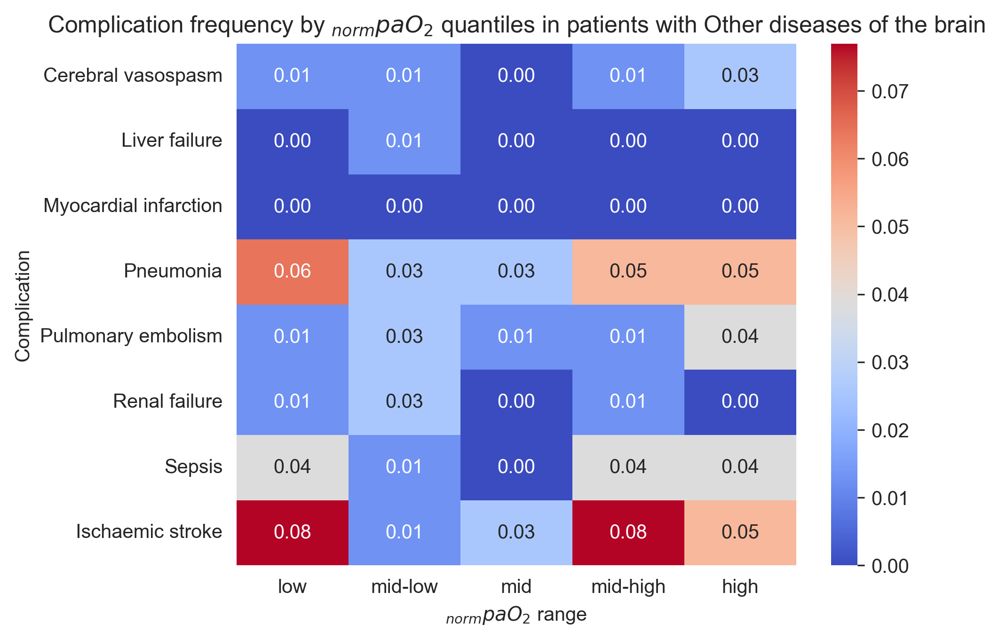


OTHER -- CEREBRAL_VASOSPASM
Prevalence: 1.3 %
No significance found.

1, 2: Effect size: Hedges' g: 0.32 (small)
[(0, 1, np.float64(0.320604712491582))]

1, 2: Effect size: Hedges' g: 0.32 (small)

OTHER -- LIVER_FAILURE
Prevalence: 0.3 %
No significance found.

1, 2: Effect size: Hedges' g: 0.55 (moderate)
[(0, 1, np.float64(0.5519367921834782))]

1, 2: Effect size: Hedges' g: 0.55 (moderate)

OTHER -- MYOCARDIAL_INFARCTION
Prevalence: 0.0 %
No significance found.
[]

OTHER -- PNEUMONIA
Prevalence: 4.4 %
No significance found.

1, 2: Effect size: Hedges' g: 0.01 (very small)
[(0, 1, np.float64(0.013181861990290767))]

1, 2: Effect size: Hedges' g: 0.01 (very small)

OTHER -- PULMONARY_EMBOLISM
Prevalence: 2.1 %
No significance found.

1, 2: Effect size: Hedges' g: 0.42 (small)
[(0, 1, np.float64(0.41907219619744773))]

1, 2: Effect size: Hedges' g: 0.42 (small)

OTHER -- RENAL_FAILURE
Prevalence: 1.0 %
No significance found.

1, 2: Effect size: Hedges' g: 0.61 (moderate)
[(0, 1, np.f

In [27]:
for d in diagnoses:
    tmp_df = analysis_df[analysis_df[d]==True].copy()
    tmp_df['paO2_bin'], edges = pd.qcut(tmp_df['norm_auc_paO2'], q=5, labels=['low', 'mid-low', 'mid', 'mid-high', 'high'], retbins = True)
    print([round(x) for x in edges])
    comp_rate = tmp_df.groupby('paO2_bin')[list(complications)].mean()
    ax = sns.heatmap(comp_rate.T, cmap="coolwarm", annot=True, fmt=".2f")
    ax.set_yticklabels([config.get('long_names')[i] for i in complications])
    plt.title("Complication frequency by $_{norm}paO_2$ quantiles in patients with "+config.get('long_names').get(d))
    plt.xlabel("$_{norm}paO_2$ range")
    plt.ylabel("Complication")
    plt.show()
    plt.close()

    for c in complications:
        print(f"\n{d.upper()} -- {c.upper()}")
        print(f"Prevalence: {round(100/analysis_df[analysis_df[d]==True].shape[0]*analysis_df[(analysis_df[d]==True)&(analysis_df[c]==True)].shape[0],1)} %")
        pvalue, ph_dunn, effect_sizes = compare_median("norm_auc_paO2", analysis_df.loc[analysis_df[d]==True,:], c, False)
        if pvalue<0.05:
            print(f"\nDifferences between patients with and without {c} in normalized perioperative auc values: {round(pvalue,4)}.\n__________________________________________\n\n")

            medians = (
                analysis_df.loc[analysis_df[d]==True,:]
                .groupby(c)["norm_auc_paO2"]
                .median()
            )
            table2_data.append([f"{config.get('long_names').get(d)}, {config.get('long_names').get(c)}", 'With vs. without', f"{int(medians.loc[True])} vs. {int(medians.loc[False])}", "<0.0001" if pvalue < 0.0001 else f"{pvalue:.4f}", f"{effect_sizes[0][-1]:.2f}", {True: f"↑ with {config.get('long_names').get(c)}", False:f"↓ with {config.get('long_names').get(c)}"}[medians.loc[True]>medians.loc[False]]])

Table 2

In [28]:
table2 = pd.DataFrame(table2_data, columns = ["Group/Condition", "Comparison", "Median normpaO2 in mmHg", "p-value", "Effect size (g)", "Direction"])
display(table2)
table2.to_csv("./data/out/table2.csv")

,Group/Condition,Comparison,Median normpaO2 in mmHg,p-value,Effect size (g),Direction
0,Malignant neoplasm,Deceased vs. Survivors,245 vs. 209,0.0011,1.11,↑ in deceased
1,Prolonged in-hospital stay (≥11 days),Normal vs. prolonged stay,213 vs. 217,0.0028,0.15,↑ with prolonged stay
2,"Prolonged in-hospital stay, ASA 3",Normal vs. prolonged stay,204 vs. 214,<0.0001,0.22,↑ with prolonged stay
3,"Prolonged in-hospital stay, females",Normal vs. prolonged stay,219 vs. 226,0.0002,0.21,↑ with prolonged stay
4,"Cerebral aneurysm, prolonged in-hospital stay ...",Normal vs. prolonged stay,271 vs. 279,0.0250,0.25,↑ with prolonged stay
5,"Subarachnoid hemorrhage, prolonged in-hospital...",Normal vs. prolonged stay,255 vs. 287,0.0003,0.53,↑ with prolonged stay
6,"Traumatic brain injury, prolonged in-hospital ...",Normal vs. prolonged stay,219 vs. 200,0.0415,0.12,↑ with normal stay
7,"Other aneurysms and dissections, prolonged in-...",Normal vs. prolonged stay,294 vs. 264,0.0406,1.20,↑ with normal stay
8,Cerebral vasospasm,With vs. without,251 vs. 213,<0.0001,0.77,↑ with Cerebral vasospasm
9,"Cerebral vasospasm, females",With vs. without,276 vs. 220,<0.0001,1.08,↑ with Cerebral vasospasm


### 3.4.6 Prevalence and odds ratios


=== benign_neoplasm (2009) ===


,complication,odds_ratio,ci,p_value,p_value_text,p_value_*
0,Cerebral vasospasm,0.1400,"[0.07, 0.26]",0.0000,<0.0001,****
3,Pneumonia,0.3500,"[0.23, 0.50]",0.0000,<0.0001,****
4,Pulmonary embolism,1.9500,"[1.41, 2.69]",0.0000,<0.0001,****
6,Sepsis,0.2600,"[0.12, 0.51]",0.0000,<0.0001,****
7,Ischaemic stroke,0.3900,"[0.26, 0.57]",0.0000,<0.0001,****
5,Renal failure,0.2500,"[0.10, 0.54]",0.0001,<0.0001,****
2,Myocardial infarction,0.3200,"[0.06, 1.15]",0.0807,0.0807,ns
1,Liver failure,0.3000,"[0.03, 1.41]",0.1402,0.1402,ns


benign_neoplasm,Other disease,With disease
Cerebral vasospasm,3.8200,0.5500
Pneumonia,5.0100,1.7900
Ischaemic stroke,4.4800,1.7900
Pulmonary embolism,2.4600,4.6800
Sepsis,1.8900,0.5000
Renal failure,1.5600,0.4000
Myocardial infarction,0.4600,0.1500
Liver failure,0.3300,0.1000


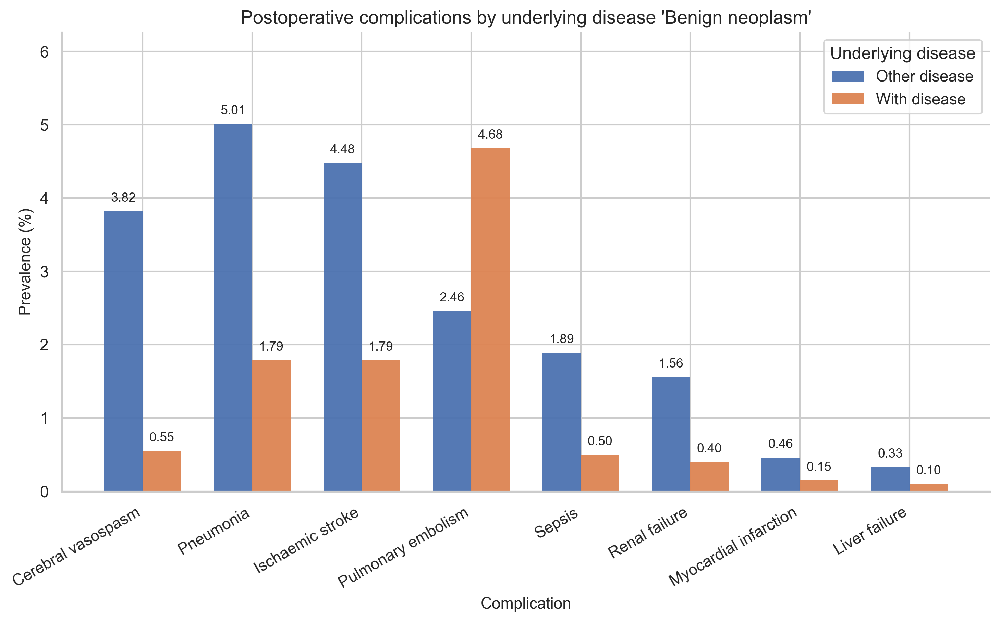


=== cerebral_aneurysm (422) ===


,complication,odds_ratio,ci,p_value,p_value_text,p_value_*
0,Cerebral vasospasm,2.2400,"[1.32, 3.65]",0.0028,0.0028,**
7,Ischaemic stroke,1.9200,"[1.19, 2.99]",0.0070,0.0070,**
3,Pneumonia,0.4800,"[0.20, 0.97]",0.0424,0.0424,*
5,Renal failure,0.2000,"[0.00, 1.17]",0.0855,0.0855,ns
2,Myocardial infarction,2.3400,"[0.43, 8.44]",0.1668,0.1668,ns
4,Pulmonary embolism,1.0700,"[0.58, 1.84]",0.7771,0.7771,ns
6,Sepsis,1.0700,"[0.38, 2.49]",0.8238,0.8238,ns
1,Liver failure,0.9900,"[0.02, 6.85]",1.0000,1.0000,ns


cerebral_aneurysm,Other disease,With disease
Ischaemic stroke,3.1800,5.9200
Cerebral vasospasm,2.2800,4.9800
Pneumonia,3.8900,1.9000
Renal failure,1.1700,0.2400
Myocardial infarction,0.3000,0.7100
Pulmonary embolism,3.3300,3.5500
Sepsis,1.3300,1.4200
Liver failure,0.2400,0.2400


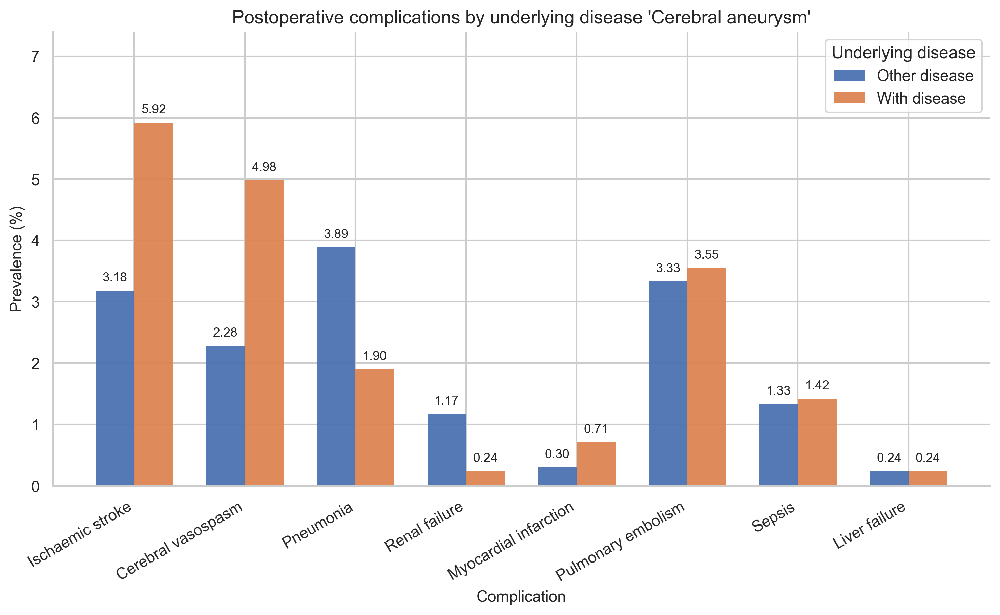


=== epilepsy (204) ===


,complication,odds_ratio,ci,p_value,p_value_text,p_value_*
3,Pneumonia,0.1200,"[0.00, 0.70]",0.0070,0.0070,**
0,Cerebral vasospasm,0.0000,"[0.00, 0.69]",0.0098,0.0098,**
4,Pulmonary embolism,0.1400,"[0.00, 0.78]",0.0149,0.0149,*
6,Sepsis,0.0000,"[0.00, 1.33]",0.1144,0.1144,ns
5,Renal failure,0.0000,"[0.00, 1.63]",0.1720,0.1720,ns
7,Ischaemic stroke,0.5600,"[0.15, 1.48]",0.3238,0.3238,ns
1,Liver failure,0.0000,"[0.00, 8.54]",1.0000,1.0000,ns
2,Myocardial infarction,0.0000,"[0.00, 5.75]",1.0000,1.0000,ns


epilepsy,Other disease,With disease
Pneumonia,3.8600,0.4900
Pulmonary embolism,3.4700,0.4900
Cerebral vasospasm,2.6200,0.0000
Ischaemic stroke,3.4700,1.9600
Sepsis,1.3900,0.0000
Renal failure,1.1400,0.0000
Myocardial infarction,0.3500,0.0000
Liver failure,0.2500,0.0000


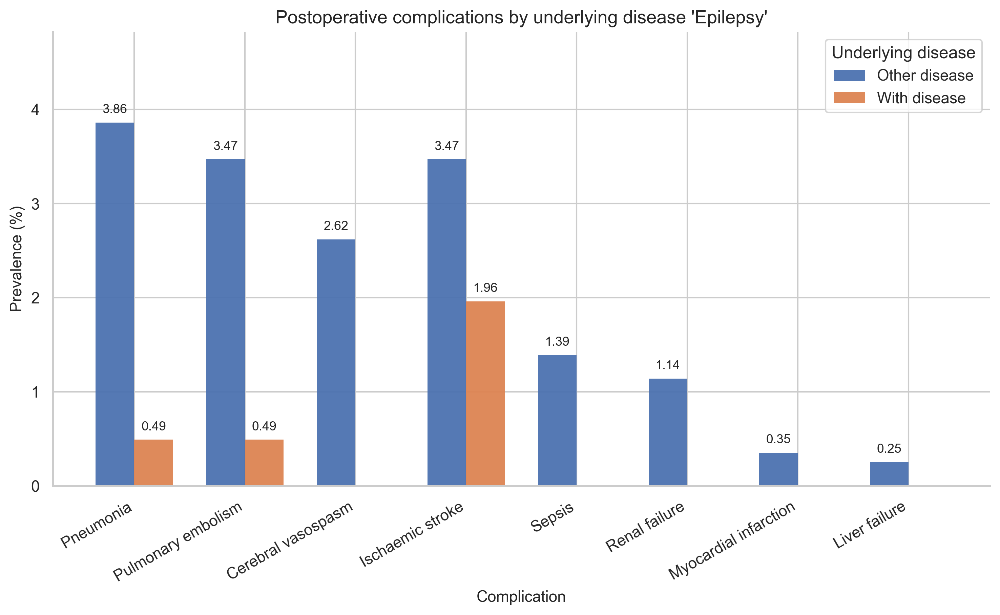


=== intracranial_hemorrhage (471) ===


,complication,odds_ratio,ci,p_value,p_value_text,p_value_*
3,Pneumonia,3.1700,"[2.18, 4.55]",0.0000,<0.0001,****
5,Renal failure,6.7000,"[3.69, 11.96]",0.0000,<0.0001,****
6,Sepsis,3.6500,"[1.98, 6.44]",0.0000,<0.0001,****
7,Ischaemic stroke,2.1300,"[1.37, 3.22]",0.0007,0.0007,***
2,Myocardial infarction,5.3200,"[1.61, 15.78]",0.0033,0.0033,**
0,Cerebral vasospasm,1.6300,"[0.92, 2.74]",0.0627,0.0627,ns
4,Pulmonary embolism,0.8000,"[0.42, 1.43]",0.5893,0.5893,ns
1,Liver failure,0.8800,"[0.02, 6.06]",1.0000,1.0000,ns


intracranial_hemorrhage,Other disease,With disease
Pneumonia,3.1400,9.3400
Renal failure,0.7300,4.6700
Ischaemic stroke,3.1000,6.3700
Sepsis,1.0800,3.8200
Cerebral vasospasm,2.3700,3.8200
Myocardial infarction,0.2400,1.2700
Pulmonary embolism,3.4100,2.7600
Liver failure,0.2400,0.2100


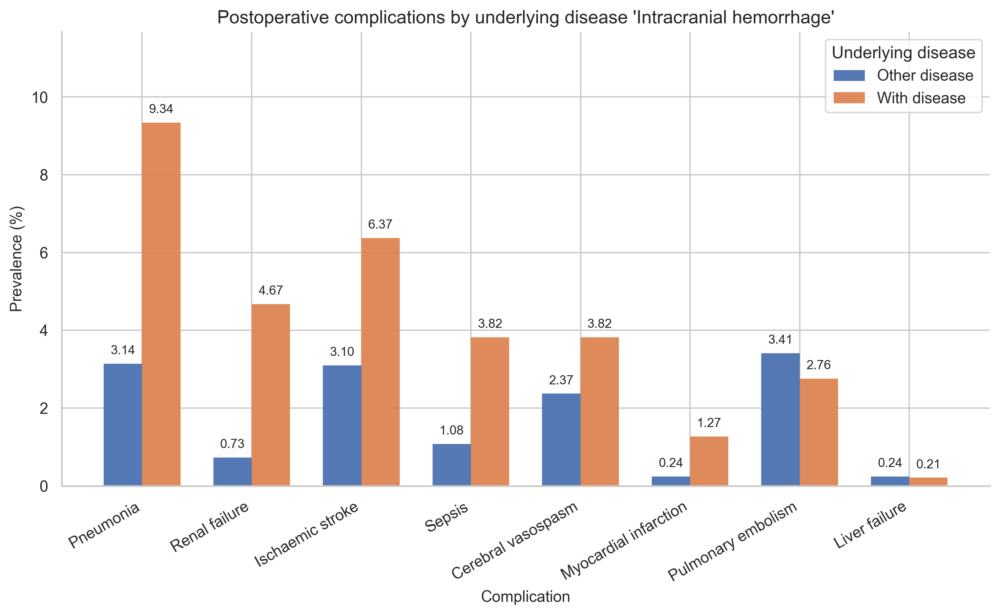


=== malignant_neoplasm (963) ===


,complication,odds_ratio,ci,p_value,p_value_text,p_value_*
7,Ischaemic stroke,0.4000,"[0.22, 0.68]",0.0002,0.0002,***
0,Cerebral vasospasm,0.3600,"[0.17, 0.68]",0.0005,0.0005,***
1,Liver failure,0.0000,"[0.00, 1.51]",0.1394,0.1394,ns
4,Pulmonary embolism,0.7300,"[0.45, 1.13]",0.1633,0.1633,ns
2,Myocardial infarction,0.2600,"[0.01, 1.69]",0.2238,0.2238,ns
6,Sepsis,0.6500,"[0.28, 1.33]",0.2750,0.2750,ns
5,Renal failure,0.6100,"[0.23, 1.37]",0.3001,0.3001,ns
3,Pneumonia,1.0400,"[0.70, 1.51]",0.8498,0.8498,ns


malignant_neoplasm,Other disease,With disease
Ischaemic stroke,3.8500,1.5600
Cerebral vasospasm,2.8600,1.0400
Pulmonary embolism,3.5200,2.6000
Sepsis,1.4300,0.9300
Renal failure,1.1800,0.7300
Liver failure,0.3000,0.0000
Myocardial infarction,0.3900,0.1000
Pneumonia,3.7000,3.8400


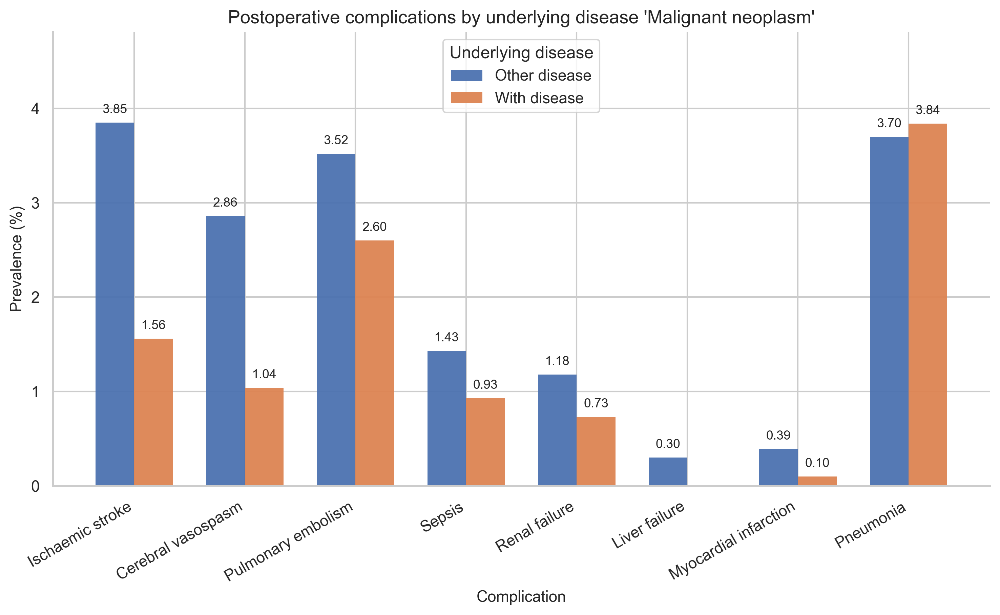


=== neoplasm (101) ===


,complication,odds_ratio,ci,p_value,p_value_text,p_value_*
3,Pneumonia,1.6500,"[0.58, 3.80]",0.2772,0.2772,ns
2,Myocardial infarction,3.0600,"[0.07, 20.10]",0.2925,0.2925,ns
5,Renal failure,1.8500,"[0.22, 7.22]",0.3039,0.3039,ns
6,Sepsis,1.5100,"[0.18, 5.82]",0.3921,0.3921,ns
0,Cerebral vasospasm,1.1900,"[0.24, 3.68]",0.7414,0.7414,ns
1,Liver failure,0.0000,"[0.00, 17.75]",1.0000,1.0000,ns
4,Pulmonary embolism,0.8800,"[0.18, 2.70]",1.0000,1.0000,ns
7,Ischaemic stroke,0.8700,"[0.17, 2.65]",1.0000,1.0000,ns


neoplasm,Other disease,With disease
Pneumonia,3.6800,5.9400
Renal failure,1.0800,1.9800
Myocardial infarction,0.3300,0.9900
Sepsis,1.3200,1.9800
Cerebral vasospasm,2.5000,2.9700
Ischaemic stroke,3.4200,2.9700
Pulmonary embolism,3.3500,2.9700
Liver failure,0.2400,0.0000


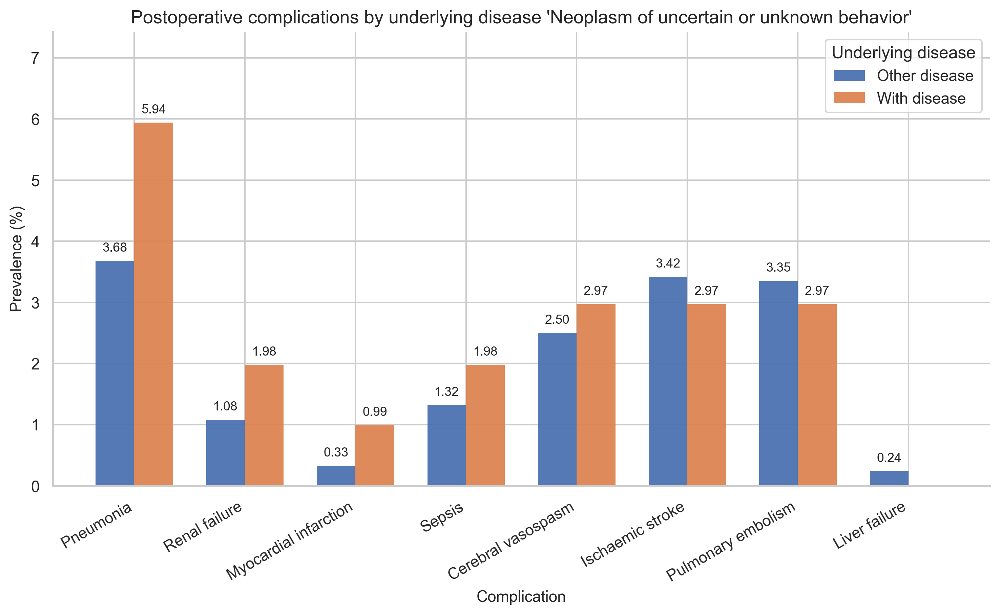


=== SAH (189) ===


,complication,odds_ratio,ci,p_value,p_value_text,p_value_*
0,Cerebral vasospasm,76.0000,"[49.67, 117.52]",0.0000,<0.0001,****
1,Liver failure,18.6900,"[4.63, 69.13]",0.0000,<0.0001,****
3,Pneumonia,4.8600,"[3.02, 7.60]",0.0000,<0.0001,****
6,Sepsis,8.6600,"[4.51, 15.81]",0.0000,<0.0001,****
7,Ischaemic stroke,13.0100,"[8.75, 19.15]",0.0000,<0.0001,****
5,Renal failure,5.2000,"[2.20, 10.96]",0.0002,0.0002,***
4,Pulmonary embolism,1.8400,"[0.88, 3.46]",0.0620,0.0620,ns
2,Myocardial infarction,3.4300,"[0.38, 14.93]",0.1326,0.1326,ns


SAH,Other disease,With disease
Cerebral vasospasm,0.9500,42.3300
Ischaemic stroke,2.5500,25.4000
Pneumonia,3.3100,14.2900
Sepsis,1.0600,8.4700
Renal failure,0.9500,4.7600
Pulmonary embolism,3.2500,5.8200
Liver failure,0.1400,2.6500
Myocardial infarction,0.3100,1.0600


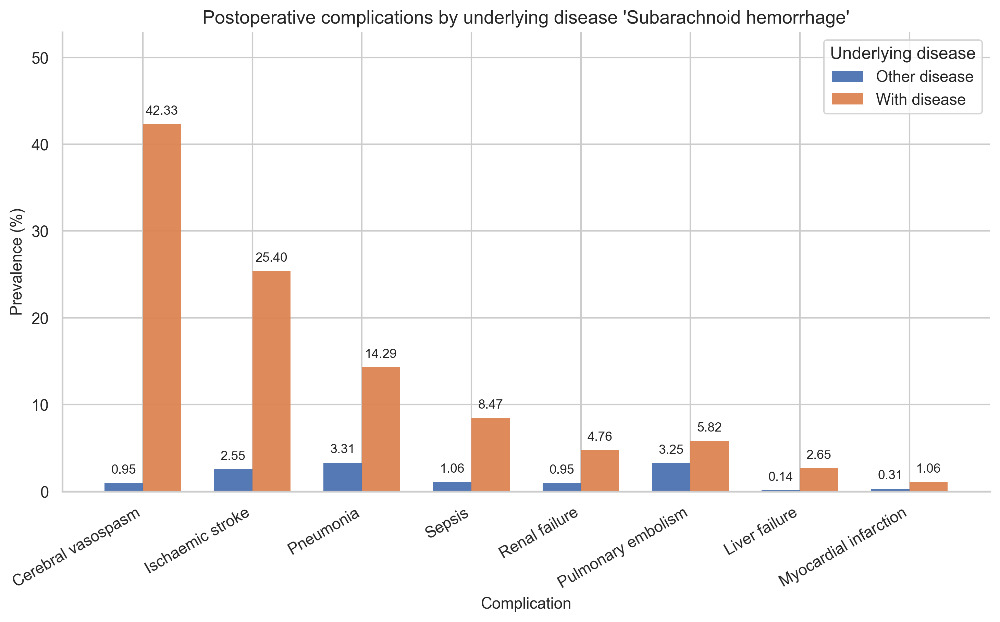


=== TBI (217) ===


,complication,odds_ratio,ci,p_value,p_value_text,p_value_*
3,Pneumonia,4.3200,"[2.71, 6.69]",0.0000,<0.0001,****
5,Renal failure,3.8700,"[1.56, 8.41]",0.0023,0.0023,**
6,Sepsis,3.0800,"[1.25, 6.58]",0.0077,0.0077,**
1,Liver failure,7.4600,"[1.29, 30.17]",0.0131,0.0131,*
2,Myocardial infarction,2.9700,"[0.33, 12.89]",0.1657,0.1657,ns
7,Ischaemic stroke,1.3900,"[0.65, 2.68]",0.3341,0.3341,ns
4,Pulmonary embolism,0.8100,"[0.29, 1.84]",0.8461,0.8461,ns
0,Cerebral vasospasm,0.9100,"[0.29, 2.22]",1.0000,1.0000,ns


TBI,Other disease,With disease
Pneumonia,3.3100,12.9000
Renal failure,0.9800,3.6900
Sepsis,1.2300,3.6900
Ischaemic stroke,3.3500,4.6100
Liver failure,0.1900,1.3800
Pulmonary embolism,3.3700,2.7600
Myocardial infarction,0.3100,0.9200
Cerebral vasospasm,2.5200,2.3000


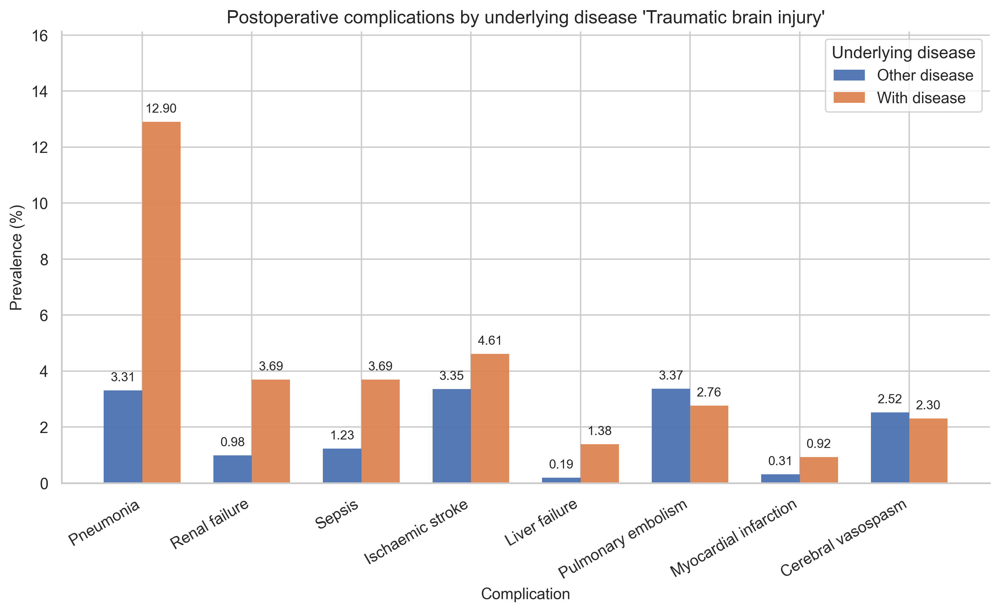


=== trigeminus (193) ===


,complication,odds_ratio,ci,p_value,p_value_text,p_value_*
3,Pneumonia,0.0000,"[0.00, 0.48]",0.0013,0.0013,**
4,Pulmonary embolism,0.0000,"[0.00, 0.54]",0.0031,0.0031,**
0,Cerebral vasospasm,0.0000,"[0.00, 0.73]",0.0154,0.0154,*
7,Ischaemic stroke,0.2900,"[0.03, 1.07]",0.0668,0.0668,ns
6,Sepsis,0.0000,"[0.00, 1.41]",0.1138,0.1138,ns
5,Renal failure,0.0000,"[0.00, 1.73]",0.2742,0.2742,ns
1,Liver failure,0.0000,"[0.00, 9.05]",1.0000,1.0000,ns
2,Myocardial infarction,0.0000,"[0.00, 6.09]",1.0000,1.0000,ns


trigeminus,Other disease,With disease
Pneumonia,3.8700,0.0000
Pulmonary embolism,3.4800,0.0000
Cerebral vasospasm,2.6100,0.0000
Ischaemic stroke,3.5000,1.0400
Sepsis,1.3900,0.0000
Renal failure,1.1400,0.0000
Myocardial infarction,0.3500,0.0000
Liver failure,0.2500,0.0000


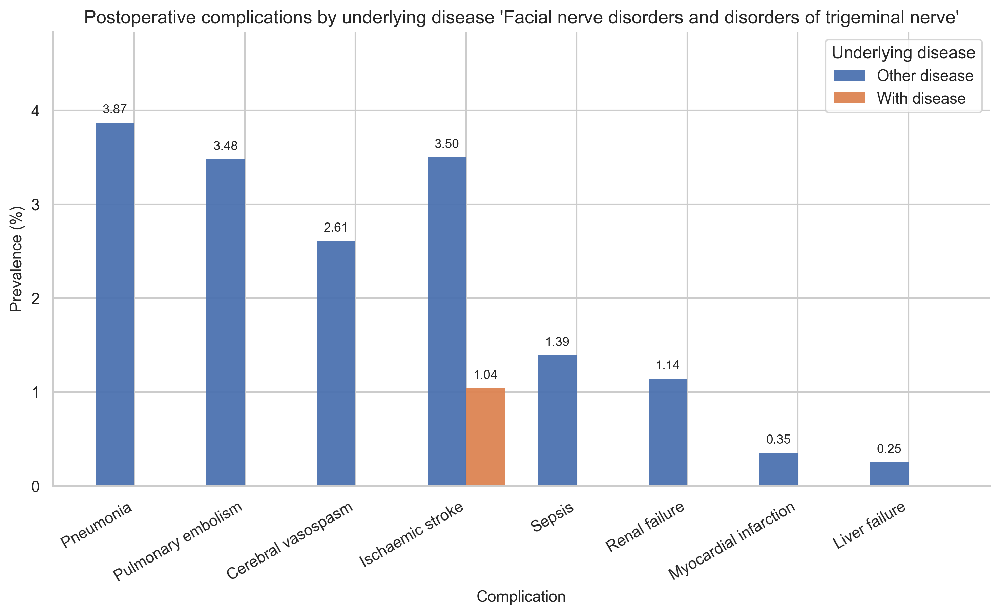


=== other_aneurysm_dissection (27) ===


,complication,odds_ratio,ci,p_value,p_value_text,p_value_*
7,Ischaemic stroke,1.0900,"[0.03, 6.72]",0.6087,0.6087,ns
0,Cerebral vasospasm,0.0000,"[0.00, 5.73]",1.0000,1.0000,ns
1,Liver failure,0.0000,"[0.00, 70.19]",1.0000,1.0000,ns
2,Myocardial infarction,0.0000,"[0.00, 47.40]",1.0000,1.0000,ns
3,Pneumonia,0.9900,"[0.02, 6.12]",1.0000,1.0000,ns
4,Pulmonary embolism,0.0000,"[0.00, 4.25]",1.0000,1.0000,ns
5,Renal failure,0.0000,"[0.00, 13.56]",1.0000,1.0000,ns
6,Sepsis,0.0000,"[0.00, 11.04]",1.0000,1.0000,ns


other_aneurysm_dissection,Other disease,With disease
Pulmonary embolism,3.3600,0.0000
Cerebral vasospasm,2.5200,0.0000
Sepsis,1.3400,0.0000
Renal failure,1.1000,0.0000
Myocardial infarction,0.3400,0.0000
Ischaemic stroke,3.4000,3.7000
Liver failure,0.2400,0.0000
Pneumonia,3.7300,3.7000


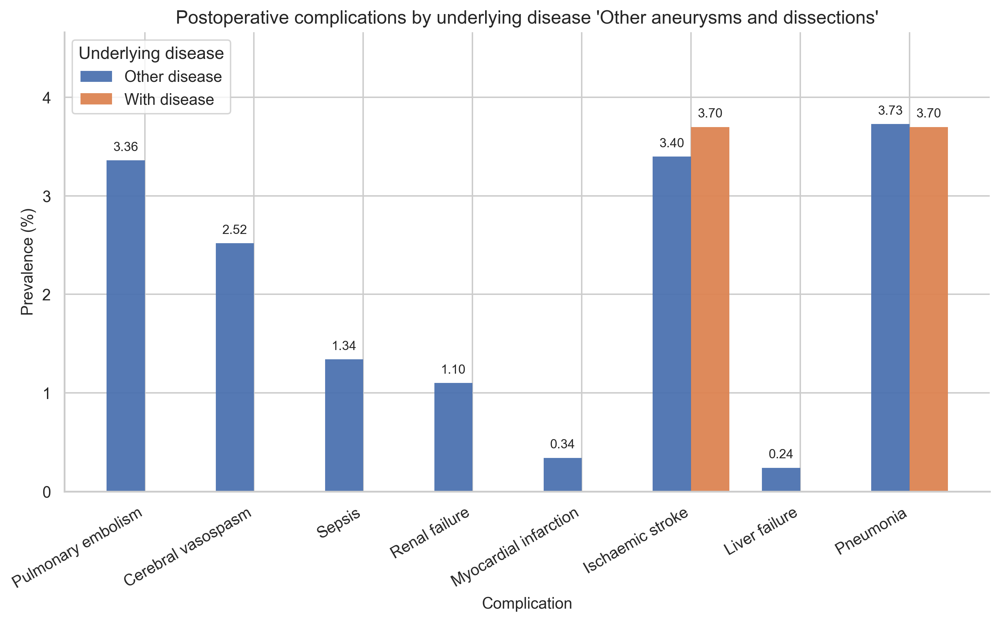


=== other (390) ===


,complication,odds_ratio,ci,p_value,p_value_text,p_value_*
6,Sepsis,2.1100,"[0.95, 4.21]",0.0368,0.0368,*
7,Ischaemic stroke,1.5100,"[0.87, 2.47]",0.1080,0.1080,ns
0,Cerebral vasospasm,0.4800,"[0.15, 1.17]",0.1277,0.1277,ns
4,Pulmonary embolism,0.5900,"[0.25, 1.19]",0.1846,0.1846,ns
3,Pneumonia,1.2000,"[0.67, 2.00]",0.4853,0.4853,ns
2,Myocardial infarction,0.0000,"[0.00, 2.88]",0.6375,0.6375,ns
1,Liver failure,1.0800,"[0.03, 7.46]",1.0000,1.0000,ns
5,Renal failure,0.9300,"[0.24, 2.55]",1.0000,1.0000,ns


other,Other disease,With disease
Ischaemic stroke,3.2800,4.8700
Pulmonary embolism,3.4600,2.0500
Sepsis,1.2300,2.5600
Cerebral vasospasm,2.6100,1.2800
Pneumonia,3.6700,4.3600
Myocardial infarction,0.3700,0.0000
Renal failure,1.1000,1.0300
Liver failure,0.2400,0.2600


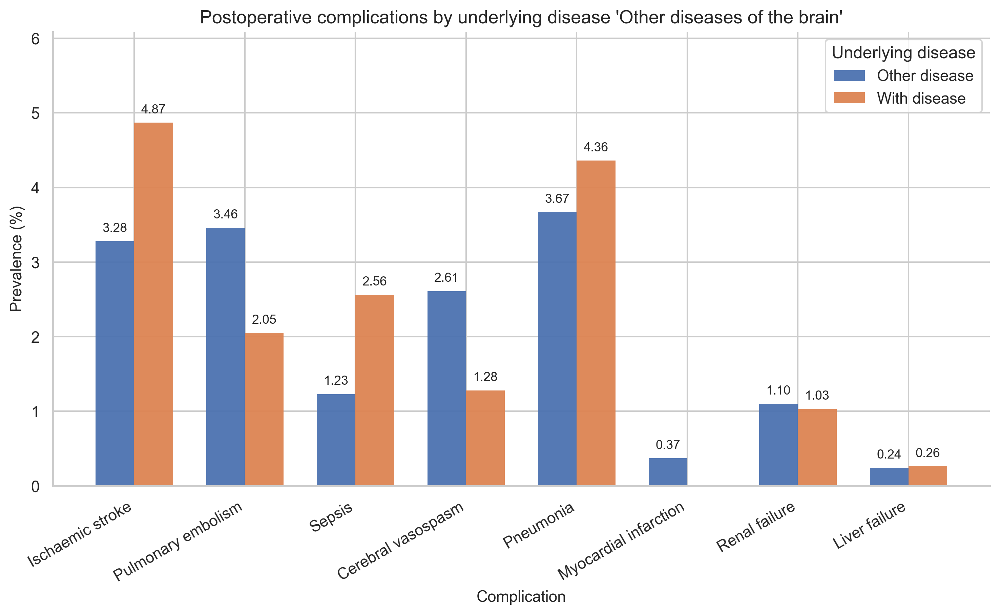

With disease  \
disease                                            complication                         
Benign neoplasm                                    Cerebral vasospasm          0.5500   
                                                   Ischaemic stroke            1.7900   
                                                   Pneumonia                   1.7900   
                                                   Pulmonary embolism          4.6800   
                                                   Renal failure               0.4000   
                                                   Sepsis                      0.5000   
Cerebral aneurysm                                  Cerebral vasospasm          4.9800   
                                                   Ischaemic stroke            5.9200   
                                                   Pneumonia                   1.9000   
Epilepsy                                           Cerebral vasospasm          0.0000   
                                                   Pneumonia                   0.4900   
                                                   Pulmonary embolism          0.4900   
Facial nerve disorders and disorders of trigemi... Cerebral vasospasm          0.0000   
                                                   Pneumonia                   0.0000   
                                                   Pulmonary embolism          0.0000   
Intracranial hemorrhage                            Ischaemic stroke            6.3700   
                                                   Myocardial infarction       1.2700   
                                                   Pneumonia                   9.3400   
                                                   Renal failure               4.6700   
                                                   Sepsis                      3.8200   
Malignant neoplasm                                 Cerebral vasospasm          1.0400   
                                                   Ischaemic stroke            1.5600   
Other diseases of the brain                        Sepsis                      2.5600   
Subarachnoid hemorrhage                            Cerebral vasospasm         42.3300   
                                                   Ischaemic stroke           25.4000   
                                                   Liver failure               2.6500   
                                                   Pneumonia                  14.2900   
                                                   Renal failure               4.7600   
                                                   Sepsis                      8.4700   
Traumatic brain injury                             Liver failure               1.3800   
                                                   Pneumonia                  12.9000   
                                                   Renal failure               3.6900   
                                                   Sepsis                      3.6900   

                                                                         Other disease  \
disease                                            complication                          
Benign neoplasm                                    Cerebral vasospasm           3.8200   
                                                   Ischaemic stroke             4.4800   
                                                   Pneumonia                    5.0100   
                                                   Pulmonary embolism           2.4600   
                                                   Renal failure                1.5600   
                                                   Sepsis                       1.8900   
Cerebral aneurysm                                  Cerebral vasospasm           2.2800   
                                                   Ischaemic stroke             3.1800   
                                                   Pneumo

In [29]:
sns.set(style="whitegrid", font_scale=1.0)

prev_index = pd.MultiIndex.from_tuples(
    list(
        zip(
            *[
                sorted(
                    len(complications)
                    * [config.get('long_names').get(d) for d in (diagnoses)]
                ),
                len(diagnoses)
                * [config.get('long_names').get(c) for c in list(complications)],
            ]
        )
    ),
    names=["disease", "complication"],
)
prev_df = pd.DataFrame(columns=["With disease", "Other disease", "odds_ratio", "ci", "p_value"], index=prev_index).sort_index()

for d in diagnoses:
    print(f"\n=== {d} ({analysis_df[d].sum()}) ===")
    results = []
    for c in complications:
        cont_table = pd.crosstab(analysis_df[d], analysis_df[c])
        # print(f"\n=== {c} ===")
        # print(cont_table)
        statistic, pvalue = stats.fisher_exact(cont_table.values)
        odds_ratio_result = stats.contingency.odds_ratio(cont_table.values)
        results.append(
            {
                "complication": config.get('long_names').get(c),
                # "total_c": analysis_df[c].sum(),
                "odds_ratio": round(odds_ratio_result.statistic,2),
                "ci": f"[{odds_ratio_result.confidence_interval().low:.2f}, {odds_ratio_result.confidence_interval().high:.2f}]",
                "p_value": round(pvalue, 4),
                "p_value_text": "<0.0001" if pvalue < 0.0001 else f"{pvalue:.4f}",
                "p_value_*": get_asterisks_for_pval(pvalue),
                # "count_true": analysis_df[(analysis_df[d]==True)&(analysis_df[c]==True)].shape[0],
                # "count_false": analysis_df[(analysis_df[d]==True)&(analysis_df[c]==False)].shape[0],
            }
        )            

    display(pd.DataFrame(results).sort_values("p_value"))

    complication_rates = (
        analysis_df.groupby(d)[list(complications)]
        .mean()
        .T.rename(index=config.get("long_names"))
        .rename(columns={False: "Other disease", True: "With disease"})
        .apply(lambda x: x * 100)
        .round(2)
        .sort_index()
    )
    complication_rates[["odds_ratio", "ci", "p_value", "p_value_text"]] = pd.DataFrame(results).sort_values("complication")[["odds_ratio", "ci", "p_value", "p_value_text"]].values

    prev_df.loc[config.get('long_names').get(d), ["With disease", "Other disease", "odds_ratio", "ci", "p_value", "p_value_text"]] = complication_rates[["With disease", "Other disease", "odds_ratio", "ci", "p_value", "p_value_text"]].values

    complication_rates = complication_rates.drop(['odds_ratio', 'ci', 'p_value', 'p_value_text'], axis = 1)
    diff = complication_rates.diff(axis=1).iloc[:, -1].abs()
    complication_rates = complication_rates.loc[diff.sort_values(ascending=False).index]

    display(complication_rates)

    fig, ax = plt.subplots(figsize=(10, 6))
    width = 0.35
    # x positions
    x = np.arange(len(complication_rates.index))

    # Colors (distinct but muted)
    colors = ["#4C72B0", "#DD8452"]

    # Bars (side-by-side)
    bars1 = ax.bar(
        x - width / 2,
        complication_rates["Other disease"],
        width,
        label="Other disease",
        edgecolor="none",
        alpha=0.95,
        color=colors[0],
    )
    bars2 = ax.bar(
        x + width / 2,
        complication_rates["With disease"],
        width,
        label="With disease",
        edgecolor="none",
        alpha=0.95,
        color=colors[1],
    )

    # Annotate values above bars
    def annotate_bars(bars, fmt="{:.1f}"):
        for bar in bars:
            h = bar.get_height()
            if h > 0:
                ax.annotate(
                    fmt.format(h),
                    xy=(bar.get_x() + bar.get_width() / 2, h),
                    xytext=(0, 5),
                    textcoords="offset points",
                    ha="center",
                    va="bottom",
                    fontsize=9,
                )

    annotate_bars(bars1, "{:.2f}")
    annotate_bars(bars2, "{:.2f}")

    # Aesthetics
    ax.set_xticks(x)
    ax.set_xticklabels(complication_rates.index, rotation=30, ha="right")
    ax.set_ylabel("Prevalence (%)", fontsize=11)
    ax.set_xlabel("Complication", fontsize=11)
    ax.legend(title="Underlying disease", frameon=True)
    ax.set_ylim(
        0, complication_rates.values.max() * 1.25
    )  # add headroom for annotations

    # Remove top/right spines for a cleaner look
    sns.despine(ax=ax)

    plt.tight_layout()
    ax.set_title(
        f"Postoperative complications by underlying disease '{config.get('long_names')[d]}'",
        fontsize=13,
    )
    plt.show()
    plt.close()


display(prev_df[prev_df['p_value']<0.05])
prev_df[prev_df['p_value']<0.05].drop('p_value', axis=1).rename({'disease': 'Disease', 'complication': 'Complication', 'With disease': 'Prevalence with disease', 'Other disease': 'Prevalence with other disease', 'odds_ratio': 'Odds Ratio', 'ci': '95 % CI', 'p_value_text': 'p value'}).to_csv("./data/out/sdc7_table.csv")

### 3.4.7 Bias assessment

SignificanceResult(statistic=np.float64(-0.15962523544487744), pvalue=np.float64(5.2610251767784266e-30))
SignificanceResult(statistic=np.float64(0.17134150588205768), pvalue=np.float64(2.2197565685151986e-34))


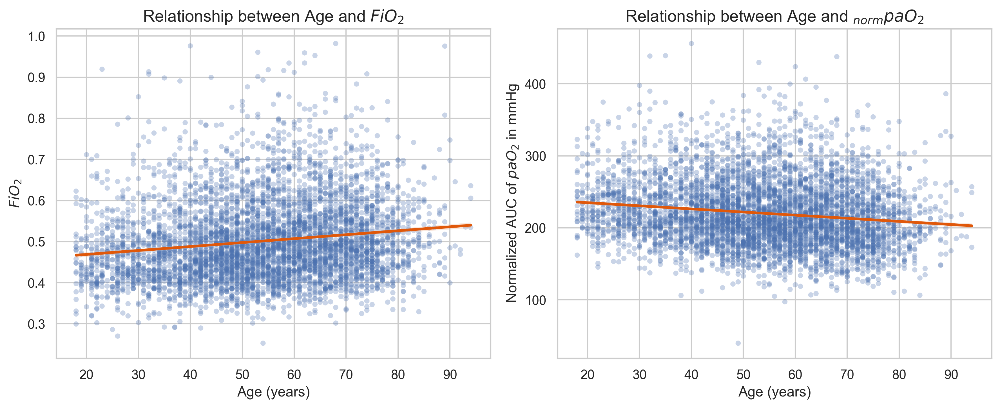

In [30]:

print(stats.spearmanr(analysis_df["norm_auc_paO2"], analysis_df["age"]))
print(stats.spearmanr(data.groupby('identifier')["fio2"].mean(), data.groupby('identifier')["age"].mean()))



fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# --- Plot 1: Age vs FiO2 ---
sns.regplot(
    x=data.groupby('identifier')["age"].mean(),
    y=data.groupby('identifier')["fio2"].mean(),
    ax=axes[0],
    scatter_kws={'alpha': 0.3, 'edgecolor': 'none', 's': 20},
    line_kws={'color': '#e0580aff'}
)
axes[0].set_xlabel("Age (years)", fontsize=12)
axes[0].set_ylabel("$FiO_2$", fontsize=12)

# --- Plot 2: Age vs norm_auc_paO2 ---
sns.regplot(
    x="age",
    y="norm_auc_paO2",
    data=analysis_df,
    ax=axes[1],
    scatter_kws={'alpha': 0.3, 'edgecolor': 'none', 's': 20},
    line_kws={'color': '#e0580aff'}
)
axes[1].set_xlabel("Age (years)", fontsize=12)
axes[1].set_ylabel("Normalized AUC of $paO_2$ in mmHg", fontsize=12)

axes[0].set_title("Relationship between Age and $FiO_2$", fontsize=14)
axes[1].set_title("Relationship between Age and $_{norm}paO_2$", fontsize=14)

plt.tight_layout()
plt.savefig('plots/age_fio2_pao2.png', dpi=300, bbox_inches="tight")

plt.show()

#### 3.4.7.1 Pulmonary embolism

In [31]:
cont_table = pd.crosstab(analysis_df["los_prolonged"], analysis_df["pulmonary_embolism"])
print(cont_table)
oddsratio, pvalue = stats.fisher_exact(cont_table)

print(f"Odds ratio: {round(oddsratio,2)}, p-value: {round(pvalue,4)} (Fisher's Exact Test)")


compare_median("bmi", analysis_df, "pulmonary_embolism", True)
compare_median("age", analysis_df, "pulmonary_embolism", True)

mean_map_df = pd.DataFrame(
    {
        "mean_map": list(
            data[data["pulmonary_embolism"] == True]
            .groupby("identifier")["mean_art_press"]
            .mean()
            .values
        )
        + list(
            data[data["pulmonary_embolism"] == False]
            .groupby("identifier")["mean_art_press"]
            .mean()
            .values
        ),
        "pulmonary_embolism": sum(analysis_df["pulmonary_embolism"] == True) * [True]
        + sum(analysis_df["pulmonary_embolism"] == False) * [False],
    }
)
compare_median("mean_map", mean_map_df, "pulmonary_embolism")

pulmonary_embolism  False  True 
los_prolonged                   
False                3535     49
True                 1317    119
Odds ratio: 6.52, p-value: 0.0 (Fisher's Exact Test)
                       bmi              
                    median    mean count
pulmonary_embolism                      
False              24.5750 25.1128  4852
True               25.8300 26.7717   168
p-value: 0.0

... Post hoc test...
     1    2
1    -  ***
2  ***    -
       1      2
1 1.0000 0.0000
2 0.0000 1.0000

1, 2: Effect size: Hedges' g: 0.38 (small)
[(np.int64(0), np.int64(1), np.float64(0.37902422094400434))]

1, 2: Effect size: Hedges' g: 0.38 (small)
                       age              
                    median    mean count
pulmonary_embolism                      
False              54.0000 53.7053  4852
True               60.5000 59.5000   168
p-value: 0.0

... Post hoc test...
     1    2
1    -  ***
2  ***    -
       1      2
1 1.0000 0.0000
2 0.0000 1.0000

1, 2: Effect siz

(np.float64(0.8232557226051618),
 None,
 [(0, 1, np.float64(0.023653035876944083))])

#### 3.4.7.2 Cerebral Vasospasm

In [32]:
cont_table = pd.crosstab(analysis_df["los_prolonged"], analysis_df["cerebral_vasospasm"])
print(cont_table)
oddsratio, pvalue = stats.fisher_exact(cont_table)

print(f"Odds ratio: {round(oddsratio,2)}, p-value: {round(pvalue,4)} (Fisher's Exact Test)")

compare_median("bmi", analysis_df, "cerebral_vasospasm", True)
compare_median("age", analysis_df, "cerebral_vasospasm", True)
compare_median("mv_time", analysis_df, "cerebral_vasospasm", True)

mean_map_df = pd.DataFrame(
    {
        "mean_map": list(
            data[data["cerebral_vasospasm"] == True]
            .groupby("identifier")["mean_art_press"]
            .mean()
            .values
        )
        + list(
            data[data["cerebral_vasospasm"] == False]
            .groupby("identifier")["mean_art_press"]
            .mean()
            .values
        ),
        "cerebral_vasospasm": sum(analysis_df["cerebral_vasospasm"] == True) * [True]
        + sum(analysis_df["cerebral_vasospasm"] == False) * [False],
    }
)
compare_median("mean_map", mean_map_df, "cerebral_vasospasm")


median_map_df = pd.DataFrame(
    {
        "median_map": list(
            data[data["cerebral_vasospasm"] == True]
            .groupby("identifier")["mean_art_press"]
            .median()
            .values
        )
        + list(
            data[data["cerebral_vasospasm"] == False]
            .groupby("identifier")["mean_art_press"]
            .median()
            .values
        ),
        "cerebral_vasospasm": sum(analysis_df["cerebral_vasospasm"] == True) * [True]
        + sum(analysis_df["cerebral_vasospasm"] == False) * [False],
    }
)
compare_median("median_map", median_map_df, "cerebral_vasospasm")


min_map_df = pd.DataFrame(
    {
        "min_map": list(
            data[data["cerebral_vasospasm"] == True]
            .groupby("identifier")["mean_art_press"]
            .min()
            .values
        )
        + list(
            data[data["cerebral_vasospasm"] == False]
            .groupby("identifier")["mean_art_press"]
            .min()
            .values
        ),
        "cerebral_vasospasm": sum(analysis_df["cerebral_vasospasm"] == True) * [True]
        + sum(analysis_df["cerebral_vasospasm"] == False) * [False],
    }
)
compare_median("min_map", min_map_df, "cerebral_vasospasm")

cerebral_vasospasm  False  True 
los_prolonged                   
False                3553     31
True                 1341     95
Odds ratio: 8.12, p-value: 0.0 (Fisher's Exact Test)
                       bmi              
                    median    mean count
cerebral_vasospasm                      
False              24.6200 25.1824  4894
True               24.4900 24.6231   126
p-value: 0.2017
No significance found.

1, 2: Effect size: Hedges' g: 0.13 (very small)
[(0, 1, np.float64(0.12751020283068523))]

1, 2: Effect size: Hedges' g: 0.13 (very small)
                       age              
                    median    mean count
cerebral_vasospasm                      
False              55.0000 53.9420  4894
True               52.0000 52.2381   126
p-value: 0.1609
No significance found.

1, 2: Effect size: Hedges' g: 0.11 (very small)
[(0, 1, np.float64(0.10693883637611136))]

1, 2: Effect size: Hedges' g: 0.11 (very small)
                    mv_time               
    

(np.float64(6.01740515268331e-07),
        1      2
 1 1.0000 0.0000
 2 0.0000 1.0000,
 [(np.int64(0), np.int64(1), np.float64(0.46100292658053454))])

#### 3.4.7.3 Hypoxia ssessment

In [33]:
grouped = (
    data.groupby("identifier")
    .agg(
        mean_fio2=("fio2", "mean"),
        mean_horowitz=("horowitz", "mean"),
        # mean_paO2=('paO2_combined', 'mean'),
        n_observations=("idx", "count"),
        n_hypoxic_obs=("paO2_combined", lambda s: (s < 120).sum()),
        n_low_pf_obs=("horowitz", lambda s: (s < 300).sum()),
    )
    .reset_index()
)
grouped["perc_hypoxic"] = grouped.apply(
    lambda x: round(100 / x["n_observations"] * x["n_hypoxic_obs"]), axis=1
)
grouped["perc_low_pf"] = grouped.apply(
    lambda x: round(100 / x["n_observations"] * x["n_low_pf_obs"]), axis=1
)


result_df = grouped.merge(
    analysis_df[["identifier", "norm_auc_paO2"] + list(complications) + diagnoses],
    on="identifier",
    how="left",
)
display(result_df.sort_values("n_hypoxic_obs", ascending=False))


print(
    f"Number of patients with normpaO2 < 120 mmHg: {result_df.loc[result_df.norm_auc_paO2 < 120].shape[0]} ({min(result_df.loc[result_df.norm_auc_paO2 < 120].perc_hypoxic.values)} - {max(result_df.loc[result_df.norm_auc_paO2 < 120].perc_hypoxic.values)} % of their total observations)."
)

print(
    f"\tMean FiO2: {round(result_df.loc[result_df.norm_auc_paO2 < 120].mean().mean_fio2,3)} and mean p/F ratio: {round(result_df.loc[result_df.norm_auc_paO2 < 120].mean().mean_horowitz,2)}."
)


print(
    f"Number of patients with mean p/F ratio < 300: {result_df.loc[result_df.mean_horowitz < 300].shape[0]} ({min(result_df.loc[result_df.mean_horowitz < 300].perc_low_pf.values)} - {max(result_df.loc[result_df.mean_horowitz < 300].perc_low_pf.values)} % of their total observations)."
)
print(
    f"\tMean FiO2: {round(result_df.loc[result_df.mean_horowitz < 300].mean().mean_fio2,3)} and mean normpaO2: {round(result_df.loc[result_df.mean_horowitz < 300].mean().norm_auc_paO2,2)}."
)
print(
    f"Number of patients with normpaO2 < 120 and mean p/F ratio < 300: {result_df.loc[(result_df.norm_auc_paO2 < 120) & (result_df.mean_horowitz < 300)].shape[0]}."
)


for c in complications:
    print(f"{c}: {int(result_df.loc[result_df.norm_auc_paO2 < 120].sum()[c])}")

for d in diagnoses:
    print(f"{d}: {int(result_df.loc[result_df.norm_auc_paO2 < 120].sum()[d])}")

,identifier,mean_fio2,mean_horowitz,n_observations,n_hypoxic_obs,n_low_pf_obs,perc_hypoxic,perc_low_pf,norm_auc_paO2,cerebral_vasospasm,...,cerebral_aneurysm,epilepsy,intracranial_hemorrhage,malignant_neoplasm,neoplasm,SAH,TBI,trigeminus,other_aneurysm_dissection,other
1592,925430,0.3788,392.2132,123,96,0,78,0,122.2239,False,...,False,False,False,False,False,False,False,False,False,False
3916,1627107,0.3055,341.6246,98,90,11,92,11,106.0663,False,...,False,False,False,True,False,False,False,False,False,False
1936,1035390,0.3749,342.6530,109,89,0,82,0,116.8306,False,...,False,False,False,True,False,False,False,False,False,False
2890,1201291,0.3363,345.4571,127,85,33,67,26,125.1078,False,...,False,False,False,False,False,False,False,False,False,False
4582,1942409,0.4141,369.5566,121,85,15,70,12,138.1427,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1785,1022137,0.5370,533.7998,76,0,0,0,0,250.7713,False,...,False,False,True,True,False,False,False,False,False,False
1786,1022145,0.5814,456.9001,30,0,0,0,0,235.2497,False,...,False,False,True,False,False,False,False,False,False,False
1787,1022294,0.5523,453.7166,45,0,0,0,0,241.2857,False,...,False,False,False,True,False,False,False,False,False,False
1789,1022443,0.5423,503.9203,55,0,10,0,18,280.8618,False,...,False,False,False,False,False,False,False,False,False,False


Number of patients with normpaO2 < 120 mmHg: 18 (57 - 94 % of their total observations).
	Mean FiO2: 0.363 and mean p/F ratio: 355.94.
Number of patients with mean p/F ratio < 300: 108 (19 - 97 % of their total observations).
	Mean FiO2: 0.543 and mean normpaO2: 196.78.
Number of patients with normpaO2 < 120 and mean p/F ratio < 300: 2.
cerebral_vasospasm: 2
liver_failure: 0
myocardial_infarction: 1
pneumonia: 1
pulmonary_embolism: 1
renal_failure: 0
sepsis: 1
stroke: 1
benign_neoplasm: 9
cerebral_aneurysm: 0
epilepsy: 0
intracranial_hemorrhage: 2
malignant_neoplasm: 3
neoplasm: 0
SAH: 1
TBI: 1
trigeminus: 0
other_aneurysm_dissection: 0
other: 3
